In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import scipy.io as sio
import seaborn as sns
%matplotlib inline
sns.set()

In [2]:
data = pd.read_csv('data.csv')
data['sss_change'] = data['sss'].diff().fillna(0)
data2 = pd.read_csv('data2.csv')
data2['sss_change'] = data2['sss'].diff().fillna(0)
data = data.set_index('new_time')
data2 = data2.set_index('new_time')
data2.head()

,time,sss,sst,wind_spd,wind_dir,precip,cum_precip3,cum_precip6,year,month,...,scaled_dir,scaled_spd,scaled_sst,pct_change,pct_c_scaled,set,sst_pct_change,dir_pct_change,spd_pct_change,sss_change
new_time,,,,,,,,,,,,,,,,,,,,,
2016-08-24 02:30:00.000028800,736566.104167,32.785813,29.972728,1.499305,-35.279577,0.000000,0.000000,0.0,2016,8,...,0.090521,-1.915939,3.406521,0.000000,0.000000,Spurs2,0.000000,0.000000,0.000000,0.000000
2016-08-24 03:29:59.999971200,736566.145833,32.789527,30.088739,2.201161,-44.300444,0.000000,0.000000,0.0,2016,8,...,0.006298,-1.601975,3.593902,0.000113,0.071216,Spurs2,2.067004,0.111099,0.366879,0.003714
2016-08-24 04:30:00.000000000,736566.187500,32.627960,29.630041,4.694584,-80.636065,10.613047,10.613047,0.0,2016,8,...,-0.332949,-0.486581,2.853013,-0.004927,-3.166366,Spurs2,-8.128834,0.285528,0.962475,-0.161567
2016-08-24 05:30:00.000028800,736566.229167,32.606144,29.366735,1.339539,141.605791,1.210007,11.823053,0.0,2016,8,...,1.742009,-1.987408,2.427721,-0.000669,-0.431001,Spurs2,-4.737377,-0.819523,-0.693011,-0.021816
2016-08-24 06:29:59.999971200,736566.270833,32.606789,29.310380,1.805641,100.847879,0.000000,11.823053,0.0,2016,8,...,1.361473,-1.778904,2.336697,0.000020,0.011158,Spurs2,-1.021055,-0.056845,0.259200,0.000645


# Spurs1

In [4]:
spurs1 = data.drop(['scaled_sss', 'scaled_spd', 'scaled_sst', 'pct_change', 'pct_c_scaled', 'sst_pct_change','dir_pct_change', 'spd_pct_change', 'scaled_dir'], axis=1)
spurs1.head()

,time,sss,sst,wind_spd,wind_dir,precip,cum_precip3,cum_precip6,year,month,day,hour,set,sss_change
new_time,,,,,,,,,,,,,,
2012-09-14 20:30:00.000028800,735126.854167,37.768217,27.886503,3.171527,-70.402566,0.0,0.0,0.0,2012,9,14,20,Spurs1,0.000000
2012-09-14 21:29:59.999971200,735126.895833,37.767291,27.794171,3.511590,-78.652231,0.0,0.0,0.0,2012,9,14,21,Spurs1,-0.000926
2012-09-14 22:30:00.000000000,735126.937500,37.767912,27.717789,4.870495,-86.660419,0.0,0.0,0.0,2012,9,14,22,Spurs1,0.000621
2012-09-14 23:30:00.000028800,735126.979167,37.768554,27.650786,4.511677,-89.874044,0.0,0.0,0.0,2012,9,14,23,Spurs1,0.000642
2012-09-15 00:29:59.999971200,735127.020833,37.770119,27.593085,4.318494,-94.403915,0.0,0.0,0.0,2012,9,15,0,Spurs1,0.001566


## Creating the Classes

In [5]:
rain = data[data['precip'] > 1e-3]['precip']
print(rain.median())
print(rain.mean())
#print(rain.cumsum())

0.3757364514794972
1.6216867217583306


In [6]:
ordered_rain = rain.sort_values(ascending=True)
new_sum = np.array(ordered_rain).cumsum()
scaled_sum = new_sum/new_sum.max()
len(scaled_sum[scaled_sum >= 0.50])
#new_sum[-11:] ## Using .33 (one-third) gives 51 values
ordered_rain[-26:]

new_time
2013-01-31 19:30:00.000000000     6.249350
2012-12-06 02:30:00.000028800     6.610404
2012-10-27 00:29:59.999971200     6.618776
2013-02-24 06:29:59.999971200     6.937127
2013-01-16 03:29:59.999971200     7.549513
2013-09-22 20:30:00.000028800     7.597011
2012-12-06 03:29:59.999971200     8.614325
2013-01-31 23:30:00.000028800     8.616783
2013-05-06 23:30:00.000028800     8.848182
2013-09-13 10:30:00.000000000     9.738845
2012-11-22 21:29:59.999971200    11.374038
2013-01-15 16:30:00.000000000    11.559571
2013-02-02 13:30:00.000000000    11.565908
2013-01-31 18:29:59.999971200    12.017001
2012-09-27 08:30:00.000028800    12.415339
2012-11-13 02:30:00.000028800    12.811936
2012-11-13 01:30:00.000000000    13.334355
2013-03-13 03:29:59.999971200    13.925118
2013-09-13 11:30:00.000028800    14.092374
2012-09-26 09:29:59.999971200    17.489069
2012-10-27 01:30:00.000000000    18.220710
2012-12-27 20:30:00.000028800    18.527092
2012-09-26 06:29:59.999971200    21.805598
20

So, we see that 50% of the cumulative data occurs beyond 6mm of rain/hr. Therefore, we will use these values as our new threshold; they are relatively rare(only 26 values) and so they should be different enough from the rest of the data.

In [7]:
X = spurs1.drop(['time','precip','cum_precip3','cum_precip6','set','year','month','day','hour'], axis=1)
y = spurs1['precip']
y = np.array([1 if i > 6 else 0 for i in y])
y

array([0, 0, 0, ..., 0, 0, 0])

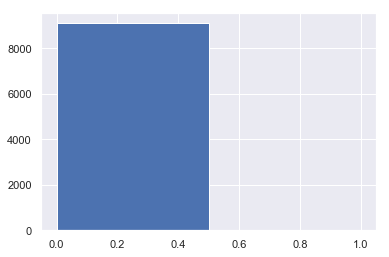

In [8]:
plt.hist(y, bins=2)
plt.show()

In [51]:
from sklearn.preprocessing import RobustScaler
rb = RobustScaler()
from imblearn.over_sampling import SMOTE
sm = SMOTE(ratio='minority', random_state=7, k_neighbors=1)

In [10]:
spurs1['scaled_sss'] = rb.fit_transform(spurs1['sss'].values.reshape(-1,1))
spurs1['scaled_sst'] = rb.fit_transform(spurs1['sst'].values.reshape(-1,1))
spurs1['scaled_dir'] = rb.fit_transform(spurs1['wind_dir'].values.reshape(-1,1))
spurs1['scaled_spd'] = rb.fit_transform(spurs1['wind_spd'].values.reshape(-1,1))
spurs1['scaled_change'] = rb.fit_transform(spurs1['sss_change'].values.reshape(-1,1))
X = spurs1.drop(['time','precip','cum_precip3','cum_precip6','set','year','month','day','hour'], axis=1)
spurs1.head(2)

,time,sss,sst,wind_spd,wind_dir,precip,cum_precip3,cum_precip6,year,month,day,hour,set,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
new_time,,,,,,,,,,,,,,,,,,,
2012-09-14 20:30:00.000028800,735126.854167,37.768217,27.886503,3.171527,-70.402566,0.0,0.0,0.0,2012,9,14,20,Spurs1,0.000000,2.587475,1.361549,0.167650,-0.851190,-0.050936
2012-09-14 21:29:59.999971200,735126.895833,37.767291,27.794171,3.511590,-78.652231,0.0,0.0,0.0,2012,9,14,21,Spurs1,-0.000926,2.580102,1.325436,0.134977,-0.741962,-0.363005


In [11]:
X.head()

,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
new_time,,,,,,,,,,
2012-09-14 20:30:00.000028800,37.768217,27.886503,3.171527,-70.402566,0.000000,2.587475,1.361549,0.167650,-0.851190,-0.050936
2012-09-14 21:29:59.999971200,37.767291,27.794171,3.511590,-78.652231,-0.000926,2.580102,1.325436,0.134977,-0.741962,-0.363005
2012-09-14 22:30:00.000000000,37.767912,27.717789,4.870495,-86.660419,0.000621,2.585045,1.295562,0.103259,-0.305485,0.158270
2012-09-14 23:30:00.000028800,37.768554,27.650786,4.511677,-89.874044,0.000642,2.590154,1.269355,0.090531,-0.420736,0.165276
2012-09-15 00:29:59.999971200,37.770119,27.593085,4.318494,-94.403915,0.001566,2.602616,1.246788,0.072590,-0.482786,0.476454


## Fixing Imbalances

In [52]:
oversampled_trainX, oversampled_trainY = sm.fit_sample(X, y)
oversampled_train = pd.concat([pd.DataFrame(oversampled_trainY), pd.DataFrame(oversampled_trainX)], axis=1)
#oversampled_train.columns = normalized_df.columns
oversampled_train.columns = ['class','sss','sst','wind_spd','wind_dir','sss_change','scaled_sss','scaled_sst','scaled_dir','scaled_spd','scaled_change']
oversampled_train

,class,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
0,0,37.768217,27.886503,3.171527,-70.402566,0.000000,2.587475,1.361549,0.167650,-0.851190,-0.050936
1,0,37.767291,27.794171,3.511590,-78.652231,-0.000926,2.580102,1.325436,0.134977,-0.741962,-0.363005
2,0,37.767912,27.717789,4.870495,-86.660419,0.000621,2.585045,1.295562,0.103259,-0.305485,0.158270
3,0,37.768554,27.650786,4.511677,-89.874044,0.000642,2.590154,1.269355,0.090531,-0.420736,0.165276
4,0,37.770119,27.593085,4.318494,-94.403915,0.001566,2.602616,1.246788,0.072590,-0.482786,0.476454
5,0,37.771025,27.549956,4.215737,-95.869389,0.000906,2.609824,1.229919,0.066786,-0.515792,0.254142
6,0,37.771811,27.513547,3.649422,-97.110130,0.000786,2.616081,1.215678,0.061872,-0.697691,0.213856
7,0,37.771269,27.500819,2.947530,-100.482562,-0.000543,2.611763,1.210700,0.048515,-0.923137,-0.233697
8,0,37.771532,27.483088,2.126957,-102.937071,0.000263,2.613855,1.203766,0.038794,-1.186704,0.037592
9,0,37.773193,27.467259,0.938292,-122.401167,0.001661,2.627077,1.197574,-0.038296,-1.568501,0.508652


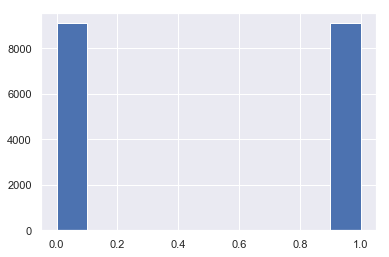

In [41]:
plt.hist(oversampled_train['class'])
plt.show()

In [42]:
#plt.subplots(figsize=(20,10))         

# Imbalanced DataFrame Correlation
oversampled_train.corr().sort_values(by='class', ascending=False).style.background_gradient('RdBu').set_precision(3)
#sns.heatmap(corr, cmap='RdBu', annot_kws={'size':30}, ax=ax)
#ax.set_title("Imbalanced Correlation Matrix", fontsize=14)

,class,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
class,1,-0.378,-0.0147,0.0749,0.173,-0.405,-0.378,-0.0147,0.173,0.0749,-0.405
wind_dir,0.173,-0.0163,-0.208,0.119,1,-0.0267,-0.0163,-0.208,1,0.119,-0.0267
scaled_dir,0.173,-0.0163,-0.208,0.119,1,-0.0267,-0.0163,-0.208,1,0.119,-0.0267
scaled_spd,0.0749,0.338,-0.338,1,0.119,0.29,0.338,-0.338,0.119,1,0.29
wind_spd,0.0749,0.338,-0.338,1,0.119,0.29,0.338,-0.338,0.119,1,0.29
scaled_sst,-0.0147,-0.0721,1,-0.338,-0.208,-0.178,-0.0721,1,-0.208,-0.338,-0.178
sst,-0.0147,-0.0721,1,-0.338,-0.208,-0.178,-0.0721,1,-0.208,-0.338,-0.178
scaled_sss,-0.378,1,-0.0721,0.338,-0.0163,0.811,1,-0.0721,-0.0163,0.338,0.811
sss,-0.378,1,-0.0721,0.338,-0.0163,0.811,1,-0.0721,-0.0163,0.338,0.811
scaled_change,-0.405,0.811,-0.178,0.29,-0.0267,1,0.811,-0.178,-0.0267,0.29,1


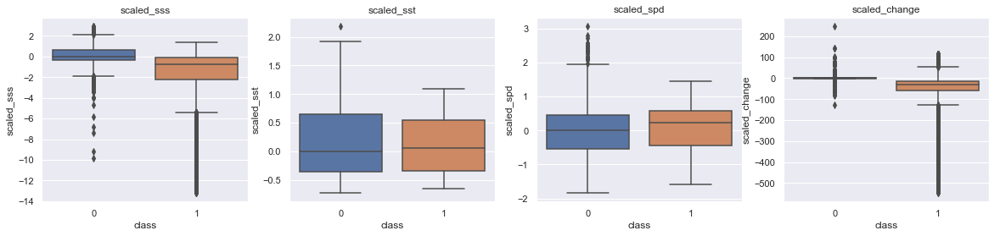

In [15]:
fig, axes = plt.subplots(ncols=4, figsize=(20,4))

# Negative Correlations with our Class (The lower our feature value the more likely it will be a fraud transaction)
sns.boxplot(x="class", y="scaled_sss", data=oversampled_train, ax=axes[0])
axes[0].set_title('scaled_sss')

sns.boxplot(x="class", y="scaled_sst", data=oversampled_train, ax=axes[1])
axes[1].set_title('scaled_sst')


sns.boxplot(x="class", y="scaled_spd", data=oversampled_train, ax=axes[2])
axes[2].set_title('scaled_spd')

sns.boxplot(x="class", y="scaled_change", data=oversampled_train, ax=axes[3])
axes[3].set_title('scaled_change')

plt.show()

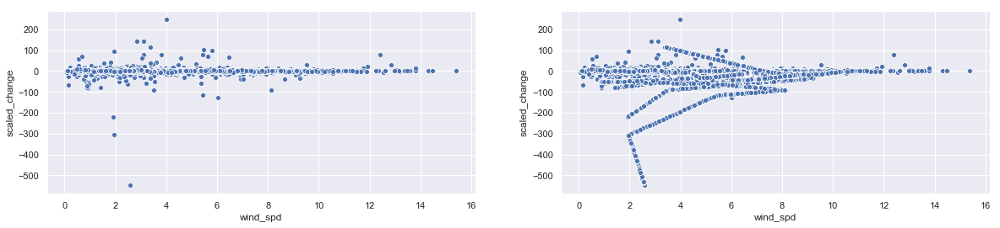

In [53]:
## 2 Neighbors
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['wind_spd'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['wind_spd'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

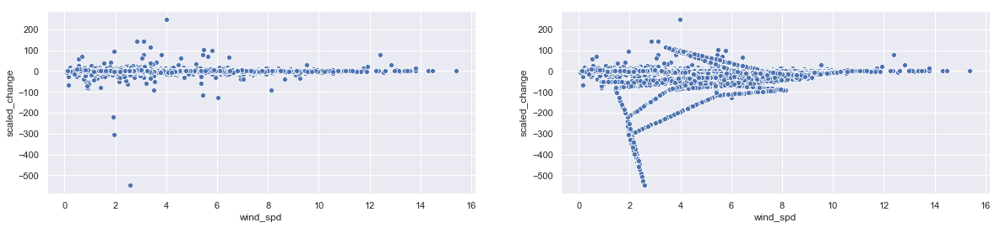

In [49]:
## 2 Neighbors
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['wind_spd'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['wind_spd'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

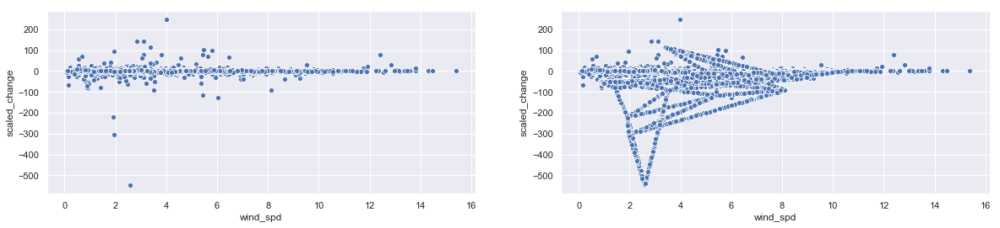

In [43]:
## 3 Neighbors
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['wind_spd'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['wind_spd'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

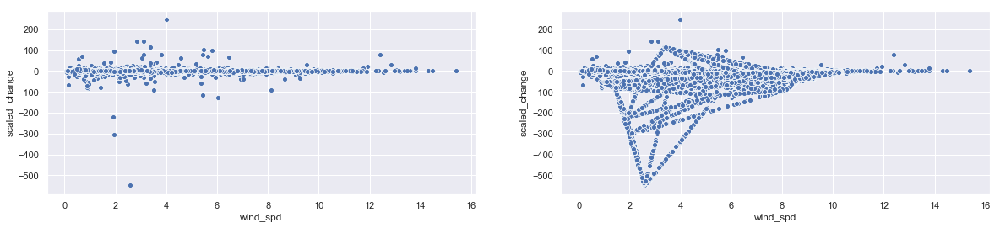

In [46]:
## 5 Neighbors (default)
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['wind_spd'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['wind_spd'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

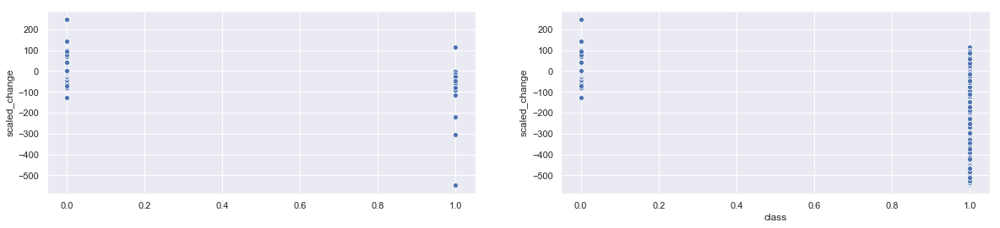

In [17]:
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=y, y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['class'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

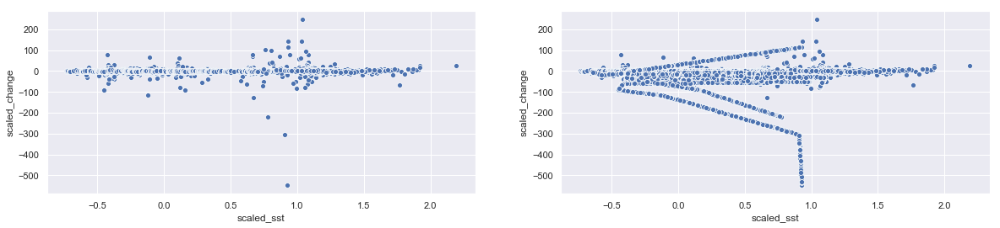

In [54]:
## Uno Neighbor
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['scaled_sst'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['scaled_sst'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

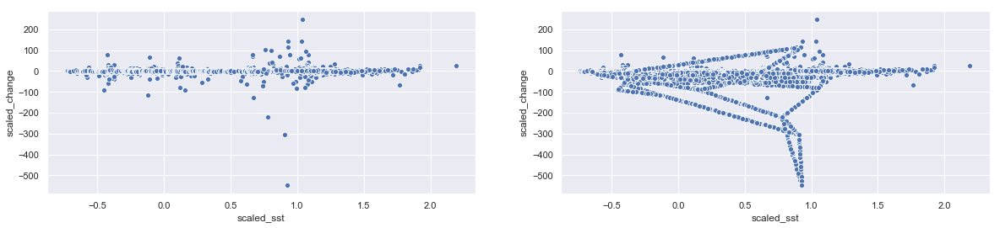

In [50]:
## 2 Neighbors
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['scaled_sst'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['scaled_sst'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

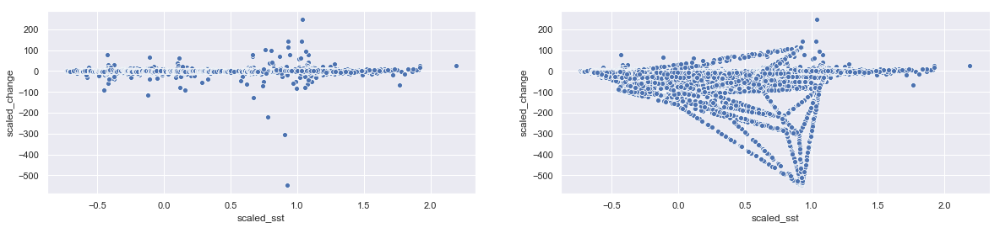

In [18]:
## 5 Neighbors
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs1['scaled_sst'], y=spurs1['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train['scaled_sst'], y=oversampled_train['scaled_change'],ax=axes[1])
plt.show()

## Models

In [19]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

X_train, X_test, y_train, y_test = train_test_split(oversampled_train.loc[:,['scaled_sst','scaled_spd','scaled_change']], 
                                                    oversampled_train.loc[:,'class'], test_size=0.25, random_state=42)
X_train.shape

(13657, 3)

### Logistic

In [21]:
from sklearn.metrics import confusion_matrix

log = LogisticRegression()
log.fit(X_train, y_train)
train_preds = log.predict(X_train)
log_preds = log.predict(X_test)
print('Logistic Test Score:', log.score(X_test, y_test))
print(confusion_matrix(y_train, train_preds), '\n')
confusion_matrix(y_test, preds)

Logistic Test Score: 0.9398198989677136
[[6758   69]
 [ 768 6062]] 



array([[2256,   22],
       [ 252, 2023]], dtype=int64)

In [29]:
from sklearn.model_selection import GridSearchCV
log_params = {'C': [x for x in range(1, 12, 2)], 'tol': [1e-3, 1e-5], 'solver': [ 'saga', 'lbfgs'],
             'multi_class': ['multinomial','auto'], 'max_iter': [100,500,1000]}

gridsearch = GridSearchCV(log, log_params, cv=10, scoring='accuracy')
gridsearch = gridsearch.fit(X_train, y_train)
print(gridsearch.best_score_)
print(gridsearch.best_estimator_)

0.9529179175514388
LogisticRegression(C=7, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='auto',
          n_jobs=None, penalty='l2', random_state=None, solver='saga',
          tol=1e-05, verbose=0, warm_start=False)


In [33]:
from sklearn.model_selection import cross_val_score
log_class = LogisticRegression(C=7, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='auto',
          n_jobs=None, penalty='l2', random_state=None, solver='saga',
          tol=1e-05, verbose=0, warm_start=False)
log_class.fit(X_train, y_train)
scores=cross_val_score(log_class, X_test, y_test, cv=4, scoring="accuracy")
print("scores ", scores)
print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
y_pred2 = log_class.predict(X_test)
print(confusion_matrix(y_test, y_pred2))

scores  [0.97190518 0.96224759 0.97275923 0.96921724]
Accuracy: 0.9690 (+/- 0.01)
[[2264   14]
 [ 192 2083]]


In [23]:
import shap
shap.initjs()

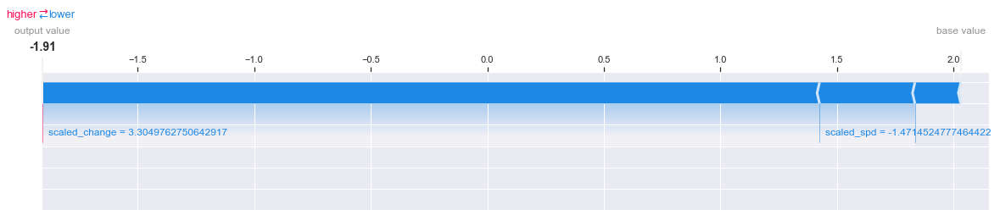

In [34]:
explainer = shap.LinearExplainer(log_class, X_train)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:], matplotlib=True)

In [35]:
shap.force_plot(explainer.expected_value, shap_values, X_train)

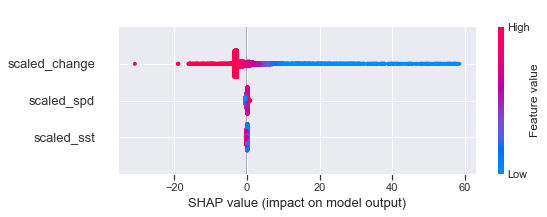

In [36]:
shap.summary_plot(shap_values, X_train)

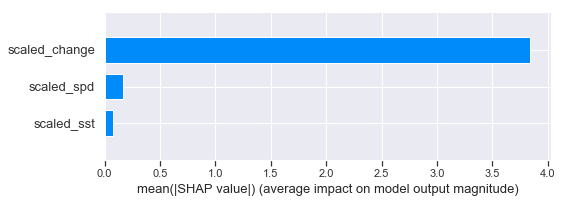

In [37]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [65]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
train_preds = knn.predict(X_train)
preds = knn.predict(X_test)
print('KNN Test Score:', knn.score(X_test, y_test), '\n')
print(confusion_matrix(y_train, train_preds), '\n')
confusion_matrix(y_test, preds)

KNN Test Score: 0.987041511091588 

[[6687  140]
 [  41 6789]] 



array([[2234,   44],
       [  15, 2260]], dtype=int64)

So from a very initial test, it seems that balancing the dataset has a pretty profound effect on false positive reduction...

In [66]:
forest = RandomForestClassifier()
forest.fit(X_train, y_train)
train_preds = forest.predict(X_train)
preds = forest.predict(X_test)
print('Random Forest Test Score:', forest.score(X_test, y_test), '\n')
print('RF Feature Importances:', forest.feature_importances_)
print(confusion_matrix(y_train, train_preds), '\n')
confusion_matrix(y_test, preds)

Random Forest Test Score: 0.993191302437953 

RF Feature Importances: [0.08382196 0.05381184 0.8623662 ]
[[6818    9]
 [   7 6823]] 



array([[2259,   19],
       [  12, 2263]], dtype=int64)

In [67]:
explainer = shap.TreeExplainer(forest)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
#shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:], matplotlib=True)

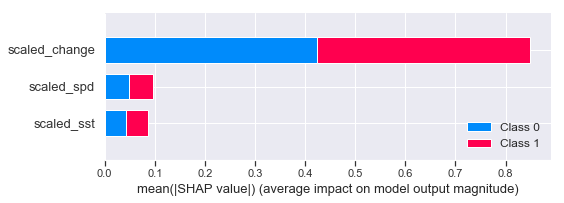

In [68]:
shap.summary_plot(shap_values, X_train)

In [69]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
train_preds = xgb.predict(X_train)
preds = xgb.predict(X_test)
print('XGBoost Test Score:', xgb.score(X_test, y_test), '\n')
print(confusion_matrix(y_train, train_preds), '\n')
confusion_matrix(y_test, preds)

XGBoost Test Score: 0.9916538546013618 

[[6748   79]
 [  30 6800]] 



array([[2252,   26],
       [  12, 2263]], dtype=int64)

In [70]:
print('XGBoost Classification Score:', xgb.score(X_test, y_test))
xgb.feature_importances_

XGBoost Classification Score: 0.9916538546013618


array([0.26433122, 0.30254778, 0.43312103], dtype=float32)

In [71]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

reduc_estimator = lgb.LGBMClassifier(learning_rate = 0.125, metric = 'l1', 
                        n_estimators = 20, num_leaves = 38)

# Parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [x for x in range(20, 36, 2)],
    'learning_rate': [0.10, 0.125, 0.15, 0.175, 0.2]}

gridsearch = GridSearchCV(reduc_estimator, param_grid)

gridsearch.fit(X_train, y_train,
        eval_set = [(X_test, y_test)],
        eval_metric = ['auc', 'binary_logloss'],
        early_stopping_rounds = 5)
print('Best parameters found by grid search are:', gridsearch.best_params_, '\n')

[1]	valid_0's auc: 0.99198	valid_0's l1: 0.452666	valid_0's binary_logloss: 0.602935
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.992187	valid_0's l1: 0.410355	valid_0's binary_logloss: 0.529012
[3]	valid_0's auc: 0.992135	valid_0's l1: 0.37248	valid_0's binary_logloss: 0.467484
[4]	valid_0's auc: 0.995445	valid_0's l1: 0.338484	valid_0's binary_logloss: 0.415511
[5]	valid_0's auc: 0.996145	valid_0's l1: 0.307839	valid_0's binary_logloss: 0.370901
[6]	valid_0's auc: 0.996211	valid_0's l1: 0.280154	valid_0's binary_logloss: 0.332407
[7]	valid_0's auc: 0.996043	valid_0's l1: 0.255294	valid_0's binary_logloss: 0.299199
[8]	valid_0's auc: 0.996104	valid_0's l1: 0.232799	valid_0's binary_logloss: 0.27017
[9]	valid_0's auc: 0.996048	valid_0's l1: 0.212494	valid_0's binary_logloss: 0.244756
[10]	valid_0's auc: 0.996508	valid_0's l1: 0.193978	valid_0's binary_logloss: 0.222104
[11]	valid_0's auc: 0.996592	valid_0's l1: 0.177259	valid_0's binary_logloss: 0.2

[23]	valid_0's auc: 0.997469	valid_0's l1: 0.0661444	valid_0's binary_logloss: 0.0809794
[24]	valid_0's auc: 0.997504	valid_0's l1: 0.0614092	valid_0's binary_logloss: 0.0760635
[25]	valid_0's auc: 0.997652	valid_0's l1: 0.0570234	valid_0's binary_logloss: 0.0714579
[26]	valid_0's auc: 0.997582	valid_0's l1: 0.0530961	valid_0's binary_logloss: 0.0675428
Did not meet early stopping. Best iteration is:
[25]	valid_0's auc: 0.997652	valid_0's l1: 0.0570234	valid_0's binary_logloss: 0.0714579
[1]	valid_0's auc: 0.994579	valid_0's l1: 0.452545	valid_0's binary_logloss: 0.602705
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996137	valid_0's l1: 0.410153	valid_0's binary_logloss: 0.528654
[3]	valid_0's auc: 0.994972	valid_0's l1: 0.372194	valid_0's binary_logloss: 0.466984
[4]	valid_0's auc: 0.995088	valid_0's l1: 0.337949	valid_0's binary_logloss: 0.414527
[5]	valid_0's auc: 0.995458	valid_0's l1: 0.307204	valid_0's binary_logloss: 0.36987
[6]	valid_0's auc

[26]	valid_0's auc: 0.997582	valid_0's l1: 0.0530961	valid_0's binary_logloss: 0.0675428
[27]	valid_0's auc: 0.997235	valid_0's l1: 0.0494723	valid_0's binary_logloss: 0.0639229
[28]	valid_0's auc: 0.997287	valid_0's l1: 0.0461604	valid_0's binary_logloss: 0.0604985
[29]	valid_0's auc: 0.997288	valid_0's l1: 0.0431661	valid_0's binary_logloss: 0.0576493
[30]	valid_0's auc: 0.99725	valid_0's l1: 0.0404009	valid_0's binary_logloss: 0.0550033
Early stopping, best iteration is:
[25]	valid_0's auc: 0.997652	valid_0's l1: 0.0570234	valid_0's binary_logloss: 0.0714579
[1]	valid_0's auc: 0.994579	valid_0's l1: 0.452545	valid_0's binary_logloss: 0.602705
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996137	valid_0's l1: 0.410153	valid_0's binary_logloss: 0.528654
[3]	valid_0's auc: 0.994972	valid_0's l1: 0.372194	valid_0's binary_logloss: 0.466984
[4]	valid_0's auc: 0.995088	valid_0's l1: 0.337949	valid_0's binary_logloss: 0.414527
[5]	valid_0's auc: 0.995458

[1]	valid_0's auc: 0.996394	valid_0's l1: 0.440715	valid_0's binary_logloss: 0.581399
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996617	valid_0's l1: 0.389475	valid_0's binary_logloss: 0.494399
[3]	valid_0's auc: 0.996545	valid_0's l1: 0.344842	valid_0's binary_logloss: 0.424646
[4]	valid_0's auc: 0.996397	valid_0's l1: 0.305943	valid_0's binary_logloss: 0.367829
[5]	valid_0's auc: 0.99663	valid_0's l1: 0.271825	valid_0's binary_logloss: 0.320592
[6]	valid_0's auc: 0.997217	valid_0's l1: 0.241907	valid_0's binary_logloss: 0.281073
[7]	valid_0's auc: 0.997095	valid_0's l1: 0.215556	valid_0's binary_logloss: 0.247575
[8]	valid_0's auc: 0.997399	valid_0's l1: 0.192241	valid_0's binary_logloss: 0.218919
[9]	valid_0's auc: 0.997081	valid_0's l1: 0.171899	valid_0's binary_logloss: 0.194672
[10]	valid_0's auc: 0.997512	valid_0's l1: 0.153798	valid_0's binary_logloss: 0.173569
[11]	valid_0's auc: 0.997551	valid_0's l1: 0.137873	valid_0's binary_logloss: 0

[6]	valid_0's auc: 0.995141	valid_0's l1: 0.241601	valid_0's binary_logloss: 0.281195
[7]	valid_0's auc: 0.995415	valid_0's l1: 0.215264	valid_0's binary_logloss: 0.247851
Early stopping, best iteration is:
[2]	valid_0's auc: 0.996121	valid_0's l1: 0.389603	valid_0's binary_logloss: 0.494761
[1]	valid_0's auc: 0.996394	valid_0's l1: 0.440715	valid_0's binary_logloss: 0.581399
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996617	valid_0's l1: 0.389475	valid_0's binary_logloss: 0.494399
[3]	valid_0's auc: 0.996545	valid_0's l1: 0.344842	valid_0's binary_logloss: 0.424646
[4]	valid_0's auc: 0.996397	valid_0's l1: 0.305943	valid_0's binary_logloss: 0.367829
[5]	valid_0's auc: 0.99663	valid_0's l1: 0.271825	valid_0's binary_logloss: 0.320592
[6]	valid_0's auc: 0.997217	valid_0's l1: 0.241907	valid_0's binary_logloss: 0.281073
[7]	valid_0's auc: 0.997095	valid_0's l1: 0.215556	valid_0's binary_logloss: 0.247575
[8]	valid_0's auc: 0.997399	valid_0's l1: 0.1

[2]	valid_0's auc: 0.992187	valid_0's l1: 0.3898	valid_0's binary_logloss: 0.495112
[3]	valid_0's auc: 0.993134	valid_0's l1: 0.345315	valid_0's binary_logloss: 0.425691
[4]	valid_0's auc: 0.996096	valid_0's l1: 0.306425	valid_0's binary_logloss: 0.368918
[5]	valid_0's auc: 0.996456	valid_0's l1: 0.272282	valid_0's binary_logloss: 0.32176
[6]	valid_0's auc: 0.995967	valid_0's l1: 0.242304	valid_0's binary_logloss: 0.2823
[7]	valid_0's auc: 0.996282	valid_0's l1: 0.215985	valid_0's binary_logloss: 0.249095
[8]	valid_0's auc: 0.995959	valid_0's l1: 0.192865	valid_0's binary_logloss: 0.220927
[9]	valid_0's auc: 0.996719	valid_0's l1: 0.17225	valid_0's binary_logloss: 0.196449
[10]	valid_0's auc: 0.996687	valid_0's l1: 0.154124	valid_0's binary_logloss: 0.175552
[11]	valid_0's auc: 0.997301	valid_0's l1: 0.138229	valid_0's binary_logloss: 0.157405
[12]	valid_0's auc: 0.997222	valid_0's l1: 0.124189	valid_0's binary_logloss: 0.142006
[13]	valid_0's auc: 0.997321	valid_0's l1: 0.1118	valid_0

[16]	valid_0's auc: 0.997848	valid_0's l1: 0.060365	valid_0's binary_logloss: 0.0751009
[17]	valid_0's auc: 0.997496	valid_0's l1: 0.0541348	valid_0's binary_logloss: 0.0687807
[18]	valid_0's auc: 0.998061	valid_0's l1: 0.0487863	valid_0's binary_logloss: 0.0633363
[19]	valid_0's auc: 0.997891	valid_0's l1: 0.0441521	valid_0's binary_logloss: 0.0587378
[20]	valid_0's auc: 0.998134	valid_0's l1: 0.0400755	valid_0's binary_logloss: 0.0546499
[21]	valid_0's auc: 0.998178	valid_0's l1: 0.036541	valid_0's binary_logloss: 0.0511727
[22]	valid_0's auc: 0.998151	valid_0's l1: 0.0334047	valid_0's binary_logloss: 0.0478138
Did not meet early stopping. Best iteration is:
[21]	valid_0's auc: 0.998178	valid_0's l1: 0.036541	valid_0's binary_logloss: 0.0511727
[1]	valid_0's auc: 0.996394	valid_0's l1: 0.429015	valid_0's binary_logloss: 0.56082
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996617	valid_0's l1: 0.369656	valid_0's binary_logloss: 0.462793
[3]	valid_0

[18]	valid_0's auc: 0.997818	valid_0's l1: 0.0481571	valid_0's binary_logloss: 0.0603988
[19]	valid_0's auc: 0.997842	valid_0's l1: 0.0433387	valid_0's binary_logloss: 0.0554933
[20]	valid_0's auc: 0.997846	valid_0's l1: 0.0393176	valid_0's binary_logloss: 0.0516684
[21]	valid_0's auc: 0.997982	valid_0's l1: 0.0359458	valid_0's binary_logloss: 0.0486592
[22]	valid_0's auc: 0.998455	valid_0's l1: 0.0329533	valid_0's binary_logloss: 0.0456412
[23]	valid_0's auc: 0.998509	valid_0's l1: 0.0303754	valid_0's binary_logloss: 0.0431522
[24]	valid_0's auc: 0.998665	valid_0's l1: 0.0281162	valid_0's binary_logloss: 0.0408867
[25]	valid_0's auc: 0.998665	valid_0's l1: 0.0262191	valid_0's binary_logloss: 0.0391344
[26]	valid_0's auc: 0.998717	valid_0's l1: 0.0243841	valid_0's binary_logloss: 0.0370855
Did not meet early stopping. Best iteration is:
[26]	valid_0's auc: 0.998717	valid_0's l1: 0.0243841	valid_0's binary_logloss: 0.0370855
[1]	valid_0's auc: 0.991973	valid_0's l1: 0.429285	valid_0's b

[20]	valid_0's auc: 0.997846	valid_0's l1: 0.0393176	valid_0's binary_logloss: 0.0516684
[21]	valid_0's auc: 0.997982	valid_0's l1: 0.0359458	valid_0's binary_logloss: 0.0486592
[22]	valid_0's auc: 0.998455	valid_0's l1: 0.0329533	valid_0's binary_logloss: 0.0456412
[23]	valid_0's auc: 0.998509	valid_0's l1: 0.0303754	valid_0's binary_logloss: 0.0431522
[24]	valid_0's auc: 0.998665	valid_0's l1: 0.0281162	valid_0's binary_logloss: 0.0408867
[25]	valid_0's auc: 0.998665	valid_0's l1: 0.0262191	valid_0's binary_logloss: 0.0391344
[26]	valid_0's auc: 0.998717	valid_0's l1: 0.0243841	valid_0's binary_logloss: 0.0370855
[27]	valid_0's auc: 0.998706	valid_0's l1: 0.0228074	valid_0's binary_logloss: 0.0357155
[28]	valid_0's auc: 0.998691	valid_0's l1: 0.0214649	valid_0's binary_logloss: 0.034537
[29]	valid_0's auc: 0.99869	valid_0's l1: 0.0202463	valid_0's binary_logloss: 0.0334839
[30]	valid_0's auc: 0.998669	valid_0's l1: 0.0193127	valid_0's binary_logloss: 0.0327799
Did not meet early stop

[34]	valid_0's auc: 0.99889	valid_0's l1: 0.0156051	valid_0's binary_logloss: 0.0295592
[1]	valid_0's auc: 0.996394	valid_0's l1: 0.429015	valid_0's binary_logloss: 0.56082
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.996617	valid_0's l1: 0.369656	valid_0's binary_logloss: 0.462793
[3]	valid_0's auc: 0.996566	valid_0's l1: 0.319487	valid_0's binary_logloss: 0.387209
[4]	valid_0's auc: 0.996555	valid_0's l1: 0.276922	valid_0's binary_logloss: 0.327493
[5]	valid_0's auc: 0.99663	valid_0's l1: 0.240572	valid_0's binary_logloss: 0.279371
[6]	valid_0's auc: 0.996565	valid_0's l1: 0.20933	valid_0's binary_logloss: 0.239887
[7]	valid_0's auc: 0.996516	valid_0's l1: 0.182668	valid_0's binary_logloss: 0.207469
[8]	valid_0's auc: 0.997547	valid_0's l1: 0.159654	valid_0's binary_logloss: 0.180301
[9]	valid_0's auc: 0.997594	valid_0's l1: 0.139994	valid_0's binary_logloss: 0.157903
[10]	valid_0's auc: 0.997558	valid_0's l1: 0.122908	valid_0's binary_logloss: 0.

[17]	valid_0's auc: 0.997433	valid_0's l1: 0.0401524	valid_0's binary_logloss: 0.0546343
[18]	valid_0's auc: 0.99742	valid_0's l1: 0.0360895	valid_0's binary_logloss: 0.0509617
[19]	valid_0's auc: 0.997457	valid_0's l1: 0.0325464	valid_0's binary_logloss: 0.0475582
Early stopping, best iteration is:
[14]	valid_0's auc: 0.99774	valid_0's l1: 0.0576954	valid_0's binary_logloss: 0.0722838
[1]	valid_0's auc: 0.994579	valid_0's l1: 0.417507	valid_0's binary_logloss: 0.541095
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.994925	valid_0's l1: 0.350745	valid_0's binary_logloss: 0.43386
[3]	valid_0's auc: 0.995369	valid_0's l1: 0.295782	valid_0's binary_logloss: 0.353812
[4]	valid_0's auc: 0.995141	valid_0's l1: 0.25026	valid_0's binary_logloss: 0.292352
[5]	valid_0's auc: 0.996369	valid_0's l1: 0.212598	valid_0's binary_logloss: 0.244504
[6]	valid_0's auc: 0.996726	valid_0's l1: 0.181069	valid_0's binary_logloss: 0.20635
[7]	valid_0's auc: 0.996723	valid_0's

Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.99662	valid_0's l1: 0.350592	valid_0's binary_logloss: 0.433353
[3]	valid_0's auc: 0.99657	valid_0's l1: 0.295979	valid_0's binary_logloss: 0.353833
[4]	valid_0's auc: 0.996146	valid_0's l1: 0.250682	valid_0's binary_logloss: 0.292578
[5]	valid_0's auc: 0.996264	valid_0's l1: 0.212796	valid_0's binary_logloss: 0.244173
[6]	valid_0's auc: 0.99682	valid_0's l1: 0.181477	valid_0's binary_logloss: 0.206071
[7]	valid_0's auc: 0.996988	valid_0's l1: 0.155246	valid_0's binary_logloss: 0.175346
[8]	valid_0's auc: 0.99697	valid_0's l1: 0.133091	valid_0's binary_logloss: 0.150189
[9]	valid_0's auc: 0.996951	valid_0's l1: 0.114581	valid_0's binary_logloss: 0.129789
[10]	valid_0's auc: 0.996964	valid_0's l1: 0.099006	valid_0's binary_logloss: 0.113086
[11]	valid_0's auc: 0.997359	valid_0's l1: 0.0857778	valid_0's binary_logloss: 0.099076
[12]	valid_0's auc: 0.997366	valid_0's l1: 0.0746007	valid_0's binary_logloss: 0

[16]	valid_0's auc: 0.997769	valid_0's l1: 0.0447627	valid_0's binary_logloss: 0.0572787
[17]	valid_0's auc: 0.99779	valid_0's l1: 0.0399331	valid_0's binary_logloss: 0.0525969
[18]	valid_0's auc: 0.997796	valid_0's l1: 0.0357121	valid_0's binary_logloss: 0.0485454
[19]	valid_0's auc: 0.997809	valid_0's l1: 0.0323623	valid_0's binary_logloss: 0.0455522
[20]	valid_0's auc: 0.998238	valid_0's l1: 0.0294806	valid_0's binary_logloss: 0.0425925
[21]	valid_0's auc: 0.998233	valid_0's l1: 0.0270537	valid_0's binary_logloss: 0.0402787
[22]	valid_0's auc: 0.998211	valid_0's l1: 0.0249581	valid_0's binary_logloss: 0.0382772
[23]	valid_0's auc: 0.998519	valid_0's l1: 0.0230949	valid_0's binary_logloss: 0.0367103
[24]	valid_0's auc: 0.998526	valid_0's l1: 0.0215145	valid_0's binary_logloss: 0.0353699
[25]	valid_0's auc: 0.998483	valid_0's l1: 0.0202121	valid_0's binary_logloss: 0.0343281
[26]	valid_0's auc: 0.998502	valid_0's l1: 0.0189848	valid_0's binary_logloss: 0.0334682
[27]	valid_0's auc: 0.

[7]	valid_0's auc: 0.997253	valid_0's l1: 0.132378	valid_0's binary_logloss: 0.150929
[8]	valid_0's auc: 0.997139	valid_0's l1: 0.111777	valid_0's binary_logloss: 0.128675
[9]	valid_0's auc: 0.997379	valid_0's l1: 0.094801	valid_0's binary_logloss: 0.110419
[10]	valid_0's auc: 0.997364	valid_0's l1: 0.0808642	valid_0's binary_logloss: 0.0959706
[11]	valid_0's auc: 0.997419	valid_0's l1: 0.0693078	valid_0's binary_logloss: 0.0842471
[12]	valid_0's auc: 0.997756	valid_0's l1: 0.0595525	valid_0's binary_logloss: 0.0737887
[13]	valid_0's auc: 0.997878	valid_0's l1: 0.0514469	valid_0's binary_logloss: 0.0653527
[14]	valid_0's auc: 0.997514	valid_0's l1: 0.044817	valid_0's binary_logloss: 0.058863
[15]	valid_0's auc: 0.997483	valid_0's l1: 0.0393263	valid_0's binary_logloss: 0.0536031
[16]	valid_0's auc: 0.997493	valid_0's l1: 0.0347191	valid_0's binary_logloss: 0.0491949
[17]	valid_0's auc: 0.997932	valid_0's l1: 0.0309973	valid_0's binary_logloss: 0.0457817
[18]	valid_0's auc: 0.998068	val

[14]	valid_0's auc: 0.997866	valid_0's l1: 0.0449983	valid_0's binary_logloss: 0.0593097
[15]	valid_0's auc: 0.99797	valid_0's l1: 0.0395672	valid_0's binary_logloss: 0.0537716
[16]	valid_0's auc: 0.997967	valid_0's l1: 0.0349964	valid_0's binary_logloss: 0.049208
[17]	valid_0's auc: 0.998298	valid_0's l1: 0.0312553	valid_0's binary_logloss: 0.0452208
[18]	valid_0's auc: 0.998338	valid_0's l1: 0.0281299	valid_0's binary_logloss: 0.0421711
[19]	valid_0's auc: 0.998364	valid_0's l1: 0.025453	valid_0's binary_logloss: 0.0396024
[20]	valid_0's auc: 0.998331	valid_0's l1: 0.023137	valid_0's binary_logloss: 0.0375672
[21]	valid_0's auc: 0.998317	valid_0's l1: 0.0212879	valid_0's binary_logloss: 0.035808
[22]	valid_0's auc: 0.998316	valid_0's l1: 0.0195615	valid_0's binary_logloss: 0.03432
[23]	valid_0's auc: 0.998813	valid_0's l1: 0.0181013	valid_0's binary_logloss: 0.0328416
[24]	valid_0's auc: 0.998908	valid_0's l1: 0.0170035	valid_0's binary_logloss: 0.0314475
[25]	valid_0's auc: 0.998918

[20]	valid_0's auc: 0.998331	valid_0's l1: 0.023137	valid_0's binary_logloss: 0.0375672
[21]	valid_0's auc: 0.998317	valid_0's l1: 0.0212879	valid_0's binary_logloss: 0.035808
[22]	valid_0's auc: 0.998316	valid_0's l1: 0.0195615	valid_0's binary_logloss: 0.03432
[23]	valid_0's auc: 0.998813	valid_0's l1: 0.0181013	valid_0's binary_logloss: 0.0328416
[24]	valid_0's auc: 0.998908	valid_0's l1: 0.0170035	valid_0's binary_logloss: 0.0314475
[25]	valid_0's auc: 0.998918	valid_0's l1: 0.0159816	valid_0's binary_logloss: 0.0303538
[26]	valid_0's auc: 0.998907	valid_0's l1: 0.0151257	valid_0's binary_logloss: 0.0296964
[27]	valid_0's auc: 0.998927	valid_0's l1: 0.0143311	valid_0's binary_logloss: 0.0288456
[28]	valid_0's auc: 0.998929	valid_0's l1: 0.0136384	valid_0's binary_logloss: 0.0281445
[29]	valid_0's auc: 0.998991	valid_0's l1: 0.0130263	valid_0's binary_logloss: 0.0269745
[30]	valid_0's auc: 0.999008	valid_0's l1: 0.0124672	valid_0's binary_logloss: 0.0265676
Did not meet early stoppi

[2]	valid_0's auc: 0.994751	valid_0's l1: 0.332494	valid_0's binary_logloss: 0.40654
[3]	valid_0's auc: 0.99536	valid_0's l1: 0.273765	valid_0's binary_logloss: 0.323637
[4]	valid_0's auc: 0.995161	valid_0's l1: 0.226422	valid_0's binary_logloss: 0.261876
[5]	valid_0's auc: 0.9952	valid_0's l1: 0.188089	valid_0's binary_logloss: 0.214725
[6]	valid_0's auc: 0.996213	valid_0's l1: 0.156978	valid_0's binary_logloss: 0.178405
[7]	valid_0's auc: 0.99579	valid_0's l1: 0.131833	valid_0's binary_logloss: 0.150333
[8]	valid_0's auc: 0.996271	valid_0's l1: 0.111199	valid_0's binary_logloss: 0.12774
[9]	valid_0's auc: 0.996353	valid_0's l1: 0.0943329	valid_0's binary_logloss: 0.109824
[10]	valid_0's auc: 0.997177	valid_0's l1: 0.0804754	valid_0's binary_logloss: 0.0954722
[11]	valid_0's auc: 0.99716	valid_0's l1: 0.0690965	valid_0's binary_logloss: 0.0840654
[12]	valid_0's auc: 0.9975	valid_0's l1: 0.0593899	valid_0's binary_logloss: 0.0738564
[13]	valid_0's auc: 0.997425	valid_0's l1: 0.0516245	

In [76]:
new = lgb.LGBMClassifier(learning_rate = 0.2, metric = 'l1', 
                        n_estimators = 30, num_leaves = 38)
new.fit(X_train, y_train)
train_preds = new.predict(X_train)
preds = new.predict(X_test)
print('Train Set Results \n', confusion_matrix(y_train, train_preds), '\n')
print('Test Set Results \n',confusion_matrix(y_test, preds))

Train Set Results 
 [[6800   27]
 [  13 6817]] 

Test Set Results 
 [[2254   24]
 [   7 2268]]


In [77]:
new.score(X_test, y_test)

0.993191302437953

In [78]:
mlp = MLPClassifier(hidden_layer_sizes=(100,100,100,))
mlp.fit(X_train, y_train)
train_preds = mlp.predict(X_train)
preds = mlp.predict(X_test)
print(mlp.score(X_test, y_test),'\n')
print('Train Set Results \n', confusion_matrix(y_train, train_preds), '\n')
print('Test Set Results \n',confusion_matrix(y_test, preds))

0.9938502086536349 

Train Set Results 
 [[6772   55]
 [  18 6812]] 

Test Set Results 
 [[2258   20]
 [   8 2267]]


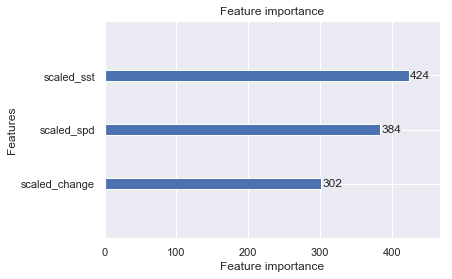

In [79]:
lgb.plot_importance(new);

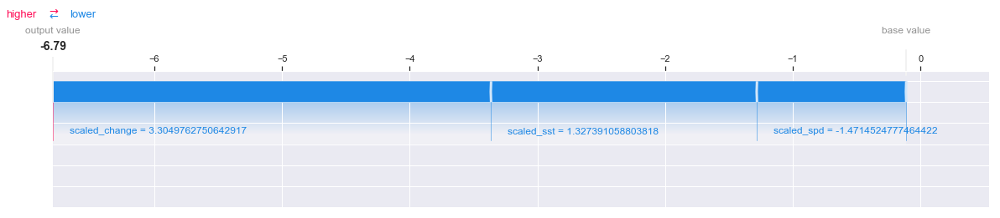

In [80]:
explainer = shap.TreeExplainer(new)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:], matplotlib=True)

To understand how a single feature effects the output of the model we can plot the SHAP value of that feature vs. the value of the feature for all the examples in a dataset. Since SHAP values represent a feature's responsibility for a change in the model output, the plot below represents the change in class (not on a scale from 0-1). Vertical dispersion at a single value of salinity change(labeled) represents interaction effects with other features. To help reveal these interactions, *dependence_plot* automatically selects another feature for coloring. In this case coloring based on class outcome highlights that the greater negative values of salinity change have less impact on the outcome with lower wind speed.

In [81]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

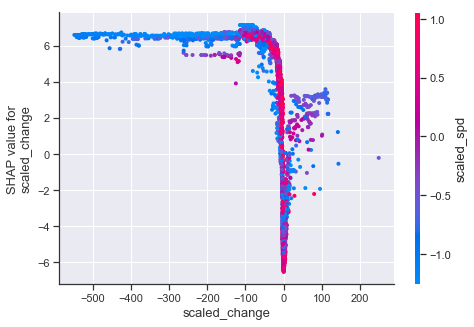

In [82]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("scaled_change", shap_values, X_train)

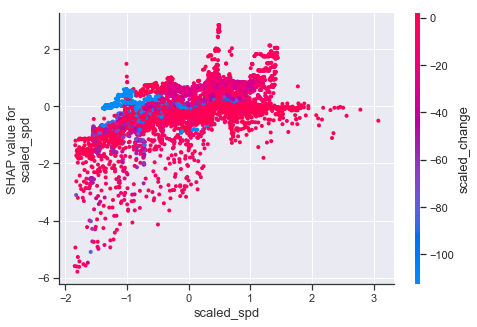

In [83]:
shap.dependence_plot("scaled_spd", shap_values, X_train)

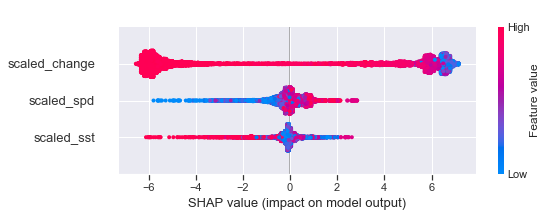

In [84]:
shap.summary_plot(shap_values, X_train)

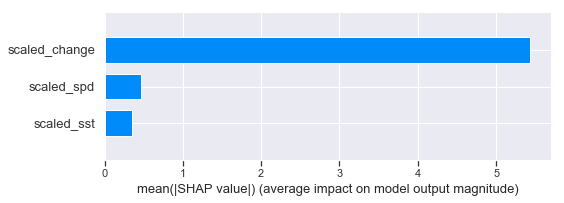

In [85]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [86]:
spurs1.describe()

,time,sss,sst,wind_spd,wind_dir,precip,cum_precip3,cum_precip6,year,month,day,hour,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
count,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9.133000e+03,9.133000e+03,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000,9133.000000
mean,735317.104167,37.452374,24.785667,5.669037,-40.574359,0.077950,2.338511e-01,4.677022e-01,2012.715756,6.627067,15.981386,11.496989,-0.000026,0.073615,0.148750,0.285788,-0.048994,-0.059595
std,109.858931,0.111020,1.445297,2.228804,133.370699,0.889278,1.838534e+00,2.846768e+00,0.451078,3.412215,8.754805,6.925319,0.028290,0.883626,0.565285,0.528228,0.715888,9.529098
min,735126.854167,35.779951,22.538164,0.074492,-179.996089,0.000000,-8.881784e-16,-1.111611e-14,2012.000000,1.000000,1.000000,0.000000,-1.628359,-13.237523,-0.730293,-0.266406,-1.845952,-548.541570
25%,735221.979167,37.397080,23.514452,4.142106,-160.589457,0.000000,3.552714e-15,-7.049916e-15,2012.000000,4.000000,8.000000,5.000000,-0.001279,-0.366475,-0.348447,-0.189544,-0.539442,-0.481708
50%,735317.104167,37.443125,24.405348,5.821573,-112.732046,0.000000,5.995204e-15,-6.217249e-15,2013.000000,7.000000,16.000000,11.000000,0.000151,0.000000,0.000000,0.000000,0.000000,0.000000
75%,735412.229167,37.522721,26.071212,7.255449,91.897439,0.000000,6.217249e-15,1.243450e-14,2013.000000,9.000000,24.000000,18.000000,0.001690,0.633525,0.651553,0.810456,0.460558,0.518292
max,735507.354167,37.815080,30.004906,15.389553,179.993404,35.374674,4.956424e+01,5.178967e+01,2013.000000,12.000000,31.000000,23.000000,0.739762,2.960467,2.190099,1.159369,3.073218,249.127743


In [87]:
oversampled_train.describe()

,class,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
count,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000,18210.000000
mean,0.500000,37.357907,24.749991,5.825360,-20.155160,-0.079815,-0.678265,0.134797,0.366660,0.001216,-26.935369
std,0.500014,0.242434,1.345919,2.240670,115.522099,0.190993,1.929577,0.526416,0.457537,0.719699,64.333514
min,0.000000,35.779951,22.538164,0.074492,-179.996089,-1.628359,-13.237523,-0.730293,-0.266406,-1.845952,-548.541570
25%,0.000000,37.323117,23.528631,4.245685,-144.023055,-0.090449,-0.955162,-0.342901,-0.123931,-0.506172,-30.517525
50%,0.500000,37.413526,24.461585,6.076923,-9.081735,-0.009095,-0.235582,0.021996,0.410518,0.082018,-3.114328
75%,1.000000,37.474269,25.933365,7.421203,75.385272,0.000288,0.247884,0.597638,0.745058,0.513798,0.046085
max,1.000000,37.815080,30.004906,15.389553,179.993404,0.739762,2.960467,2.190099,1.159369,3.073218,249.127743


# Spurs2

In [55]:
spurs2 = data2.drop(['scaled_sss', 'scaled_spd', 'scaled_sst', 'pct_change', 'pct_c_scaled', 'sst_pct_change','dir_pct_change', 'spd_pct_change', 'scaled_dir'], axis=1)
spurs2.head()

,time,sss,sst,wind_spd,wind_dir,precip,cum_precip3,cum_precip6,year,month,day,hour,set,sss_change
new_time,,,,,,,,,,,,,,
2016-08-24 02:30:00.000028800,736566.104167,32.785813,29.972728,1.499305,-35.279577,0.000000,0.000000,0.0,2016,8,24,2,Spurs2,0.000000
2016-08-24 03:29:59.999971200,736566.145833,32.789527,30.088739,2.201161,-44.300444,0.000000,0.000000,0.0,2016,8,24,3,Spurs2,0.003714
2016-08-24 04:30:00.000000000,736566.187500,32.627960,29.630041,4.694584,-80.636065,10.613047,10.613047,0.0,2016,8,24,4,Spurs2,-0.161567
2016-08-24 05:30:00.000028800,736566.229167,32.606144,29.366735,1.339539,141.605791,1.210007,11.823053,0.0,2016,8,24,5,Spurs2,-0.021816
2016-08-24 06:29:59.999971200,736566.270833,32.606789,29.310380,1.805641,100.847879,0.000000,11.823053,0.0,2016,8,24,6,Spurs2,0.000645


## Creating the Classes

In [56]:
rain2 = data2[data2['precip'] > 1e-3]['precip']
print(rain2.median())
print(rain2.mean())
#print(rain.cumsum())

0.5300016591747934
2.187857644284851


In [62]:
ordered_rain2 = rain2.sort_values(ascending=True)
new_sum2 = np.array(ordered_rain2).cumsum()
scaled_sum2 = new_sum2/new_sum2.max()
first = len(scaled_sum2[scaled_sum2 >= 0.50])
ordered_rain2[-first:(-first+1)]

new_time
2016-09-19 03:29:59.999971200    7.478358
Name: precip, dtype: float64

In [63]:
X1 = spurs2.drop(['time','precip','cum_precip3','cum_precip6','set','year','month','day','hour'], axis=1)
y1 = spurs2['precip']
y1 = np.array([1 if i > 7.4 else 0 for i in y1])
y1

array([0, 0, 1, ..., 0, 0, 0])

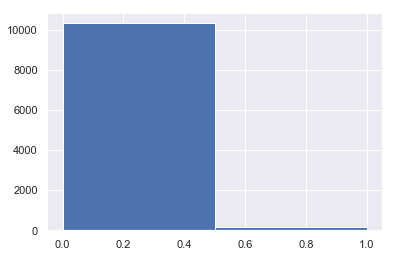

In [64]:
plt.hist(y1, bins=2)
plt.show()

## Fixing Imbalances

In [65]:
from sklearn.preprocessing import RobustScaler
rb = RobustScaler()
from imblearn.over_sampling import SMOTE
sm = SMOTE(ratio='minority', random_state=7)

In [66]:
spurs2['scaled_sss'] = rb.fit_transform(spurs2['sss'].values.reshape(-1,1))
spurs2['scaled_sst'] = rb.fit_transform(spurs2['sst'].values.reshape(-1,1))
spurs2['scaled_dir'] = rb.fit_transform(spurs2['wind_dir'].values.reshape(-1,1))
spurs2['scaled_spd'] = rb.fit_transform(spurs2['wind_spd'].values.reshape(-1,1))
spurs2['scaled_change'] = rb.fit_transform(spurs2['sss_change'].values.reshape(-1,1))
X1 = spurs2.drop(['time','precip','cum_precip3','cum_precip6','set','year','month','day','hour'], axis=1)
#spurs2.head(2)
X1.head(2)

,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
new_time,,,,,,,,,,
2016-08-24 02:30:00.000028800,32.785813,29.972728,1.499305,-35.279577,0.000000,-0.502340,1.842334,0.375708,-1.413481,-0.067385
2016-08-24 03:29:59.999971200,32.789527,30.088739,2.201161,-44.300444,0.003714,-0.499145,1.950473,0.329328,-1.199550,0.329980


In [67]:
oversampled_trainX1, oversampled_trainY1 = sm.fit_sample(X1, y1)
oversampled_train1 = pd.concat([pd.DataFrame(oversampled_trainY1), pd.DataFrame(oversampled_trainX1)], axis=1)
#oversampled_train.columns = normalized_df.columns
oversampled_train1.columns = ['class','sss','sst','wind_spd','wind_dir','sss_change','scaled_sss','scaled_sst','scaled_dir','scaled_spd','scaled_change']
oversampled_train1.head(15)

,class,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
0,0,32.785813,29.972728,1.499305,-35.279577,0.000000,-0.502340,1.842334,0.375708,-1.413481,-0.067385
1,0,32.789527,30.088739,2.201161,-44.300444,0.003714,-0.499145,1.950473,0.329328,-1.199550,0.329980
2,1,32.627960,29.630041,4.694584,-80.636065,-0.161567,-0.638152,1.522902,0.142513,-0.439537,-17.352338
3,0,32.606144,29.366735,1.339539,141.605791,-0.021816,-0.656922,1.277463,1.285144,-1.462179,-2.401326
4,0,32.606789,29.310380,1.805641,100.847879,0.000645,-0.656367,1.224933,1.075592,-1.320108,0.001623
5,0,32.615632,29.230665,2.284944,89.099590,0.008843,-0.648759,1.150627,1.015190,-1.174013,0.878628
6,0,32.638513,29.209476,2.324934,80.657863,0.022881,-0.629073,1.130876,0.971787,-1.161824,2.380501
7,0,32.651120,29.192572,1.590339,73.928491,0.012607,-0.618227,1.115119,0.937189,-1.385733,1.281321
8,0,32.635950,29.125027,1.665441,71.233928,-0.015170,-0.631278,1.052158,0.923335,-1.362841,-1.690283
9,0,32.628499,29.014933,2.446551,53.377252,-0.007451,-0.637689,0.949534,0.831527,-1.124754,-0.864532


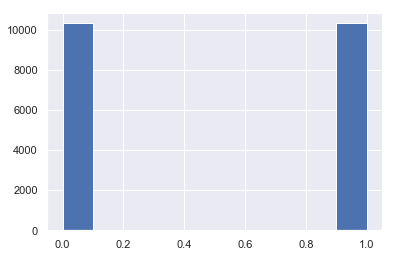

In [68]:
plt.hist(oversampled_train1['class'])
plt.show()

In [69]:
#plt.subplots(figsize=(20,10))         

# Imbalanced DataFrame Correlation
oversampled_train1.corr().style.background_gradient('RdBu').set_precision(3)
#sns.heatmap(corr, cmap='RdBu', annot_kws={'size':30}, ax=ax)
#ax.set_title("Imbalanced Correlation Matrix", fontsize=14)

,class,sss,sst,wind_spd,wind_dir,sss_change,scaled_sss,scaled_sst,scaled_dir,scaled_spd,scaled_change
class,1,-0.451,0.0281,-0.102,0.205,-0.517,-0.451,0.0281,0.205,-0.102,-0.517
sss,-0.451,1,-0.387,0.401,-0.408,0.453,1,-0.387,-0.408,0.401,0.453
sst,0.0281,-0.387,1,-0.314,0.349,-0.0719,-0.387,1,0.349,-0.314,-0.0719
wind_spd,-0.102,0.401,-0.314,1,-0.183,0.321,0.401,-0.314,-0.183,1,0.321
wind_dir,0.205,-0.408,0.349,-0.183,1,-0.159,-0.408,0.349,1,-0.183,-0.159
sss_change,-0.517,0.453,-0.0719,0.321,-0.159,1,0.453,-0.0719,-0.159,0.321,1
scaled_sss,-0.451,1,-0.387,0.401,-0.408,0.453,1,-0.387,-0.408,0.401,0.453
scaled_sst,0.0281,-0.387,1,-0.314,0.349,-0.0719,-0.387,1,0.349,-0.314,-0.0719
scaled_dir,0.205,-0.408,0.349,-0.183,1,-0.159,-0.408,0.349,1,-0.183,-0.159
scaled_spd,-0.102,0.401,-0.314,1,-0.183,0.321,0.401,-0.314,-0.183,1,0.321


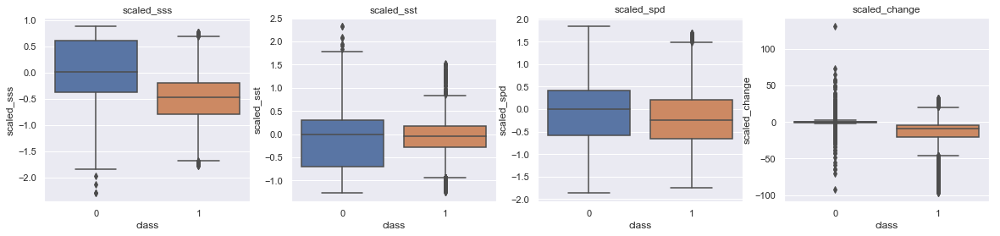

In [70]:
sns.set()
fig, axes = plt.subplots(ncols=4, figsize=(20,4))

# Negative Correlations with our Class (The lower our feature value the more likely it will be a fraud transaction)
sns.boxplot(x="class", y="scaled_sss", data=oversampled_train1, ax=axes[0])
axes[0].set_title('scaled_sss')

sns.boxplot(x="class", y="scaled_sst", data=oversampled_train1, ax=axes[1])
axes[1].set_title('scaled_sst')


sns.boxplot(x="class", y="scaled_spd", data=oversampled_train1, ax=axes[2])
axes[2].set_title('scaled_spd')

sns.boxplot(x="class", y="scaled_change", data=oversampled_train1, ax=axes[3])
axes[3].set_title('scaled_change')

plt.show()

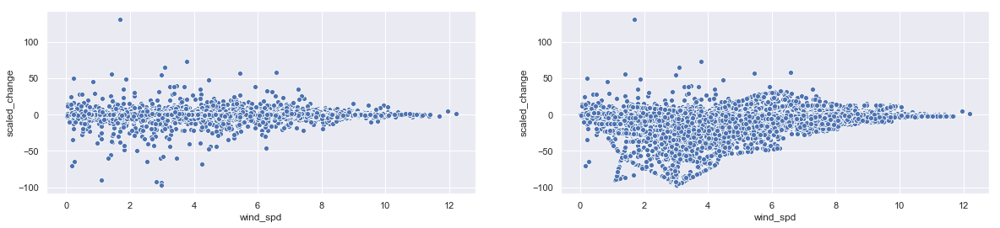

In [71]:
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs2['wind_spd'], y=spurs2['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train1['wind_spd'], y=oversampled_train1['scaled_change'],ax=axes[1])
plt.show()

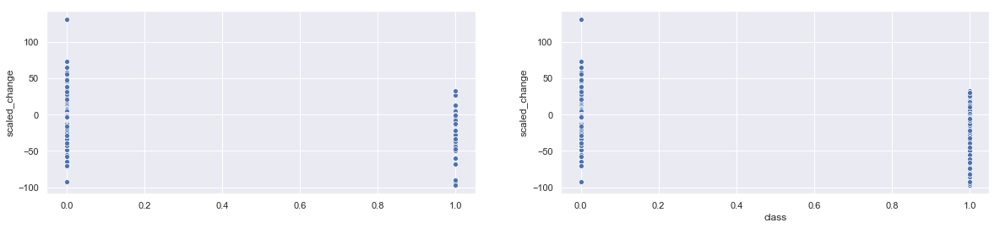

In [74]:
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=y1, y=spurs2['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train1['class'], y=oversampled_train1['scaled_change'],ax=axes[1])
plt.show()

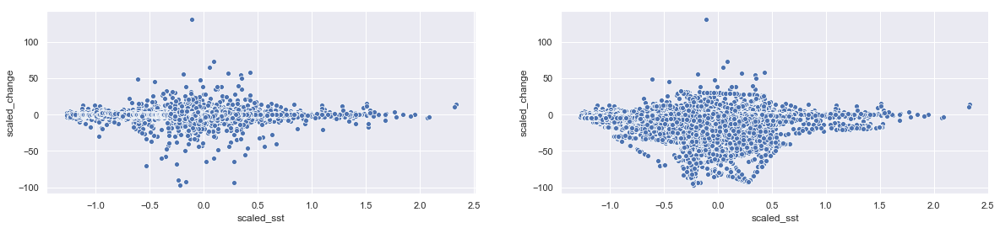

In [75]:
fig, axes = plt.subplots(ncols=2, figsize=(20,4))
sns.scatterplot(x=spurs2['scaled_sst'], y=spurs2['scaled_change'], ax=axes[0])
sns.scatterplot(x=oversampled_train1['scaled_sst'], y=oversampled_train1['scaled_change'],ax=axes[1])
plt.show()

## Models

In [76]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

X_train1, X_test1, y_train1, y_test1 = train_test_split(oversampled_train1.loc[:,['scaled_sst','scaled_spd','scaled_change']], 
                                                    oversampled_train1.loc[:,'class'], test_size=0.20, random_state=42)
X_train1.shape

(16507, 3)

### Logistic

In [77]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

log1 = LogisticRegression()
log1.fit(X_train1, y_train1)
train_preds1 = log1.predict(X_train1)
preds1 = log1.predict(X_test1)
print('Logistic Test Score:', log1.score(X_test1, y_test1))
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, preds1)

Logistic Test Score: 0.8803004603828447
[[7887  350]
 [1551 6719]] 



array([[2001,   79],
       [ 415, 1632]], dtype=int64)

In [126]:
log_params = {'C': [x for x in range(1, 12, 2)], 'tol': [1e-3, 1e-5], 'solver': [ 'saga', 'lbfgs'],
             'multi_class': ['multinomial','auto'], 'max_iter': [100,500,1000]}

gridsearch = GridSearchCV(log1, log_params, cv=10, scoring='accuracy')
gridsearch = gridsearch.fit(X_train1, y_train1)
print(gridsearch.best_score_)
print(gridsearch.best_estimator_)

0.8847155752105168
LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=1000, multi_class='multinomial',
          n_jobs=None, penalty='l2', random_state=None, solver='saga',
          tol=0.001, verbose=0, warm_start=False)


In [78]:
from sklearn.model_selection import cross_val_score
log_class1 = LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=1000, multi_class='multinomial',
          n_jobs=None, penalty='l2', random_state=None, solver='saga',
          tol=0.001, verbose=0, warm_start=False)
log_class1.fit(X_train1, y_train1)
scores=cross_val_score(log_class1, X_test1, y_test1, cv=4, scoring="accuracy")
print("scores ", scores)
print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
y_pred2 = log_class1.predict(X_test1)
print(confusion_matrix(y_test1, y_pred2))

scores  [0.87984496 0.88662791 0.86337209 0.88942774]
Accuracy: 0.8798 (+/- 0.02)
[[2001   79]
 [ 415 1632]]


### KNN

In [114]:
knn1 = KNeighborsClassifier()
knn1.fit(X_train1, y_train1)
train_preds1 = knn1.predict(X_train1)
preds1 = knn1.predict(X_test1)
print('KNN Test Score:', knn1.score(X_test1, y_test1), '\n')
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, preds1)

KNN Test Score: 0.9214926096438091 

[[7632  605]
 [ 348 7922]] 



array([[1907,  173],
       [ 151, 1896]], dtype=int64)

In [130]:
knn_params = {'n_neighbors': [x for x in range(1, 16, 2)], 'p': [1,2], 'algorithm': [ 'brute', 'auto'],
             'metric': ['minkowski','manhattan']}

gridsearch = GridSearchCV(knn1, knn_params, cv=10, scoring='accuracy')
gridsearch = gridsearch.fit(X_train1, y_train1)
print(gridsearch.best_score_)
print(gridsearch.best_estimator_)

0.9257890591870116
KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=3, p=1,
           weights='uniform')


In [138]:
knn_class1 = KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=3, p=1,
           weights='uniform')
knn_class1.fit(X_train1, y_train1)
scores=cross_val_score(knn_class1, X_test1, y_test1, cv=4, scoring="accuracy")
print("scores", scores)
print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
y_pred2 = knn_class1.predict(X_test1)
print(confusion_matrix(y_test1, y_pred2))
print(knn_class1.score(X_test1, y_test1))

scores [0.88953488 0.90988372 0.88662791 0.90494665]
Accuracy: 0.8977 (+/- 0.02)
[[1899  181]
 [ 119 1928]]
0.9273079718924158


### Random Forests

In [81]:
from sklearn.ensemble import RandomForestClassifier
forest1 = RandomForestClassifier()
forest1.fit(X_train1, y_train1)
train_preds1 = forest1.predict(X_train1)
preds1 = forest1.predict(X_test1)
print('Random Forest Test Score:', forest1.score(X_test1, y_test1), '\n')
print('Feature Importances:', forest1.feature_importances_, '\n')
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, preds1)

Random Forest Test Score: 0.9500848073661255 

Feature Importances: [0.16707992 0.13168378 0.70123631] 

[[8212   25]
 [  37 8233]] 



array([[1993,   87],
       [ 119, 1928]], dtype=int64)

In [82]:
forest_params = {'n_estimators': [10,100,500]}

gridsearch = GridSearchCV(forest1, forest_params, cv=10, scoring='accuracy')
gridsearch = gridsearch.fit(X_train1, y_train1)
print(gridsearch.best_score_)
print(gridsearch.best_estimator_)

KeyboardInterrupt: 

In [83]:
forest_class1 = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
forest_class1.fit(X_train1, y_train1)
scores=cross_val_score(forest_class1, X_test1, y_test1, cv=4, scoring="accuracy")
print("scores", scores)
print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
y_pred2 = forest_class1.predict(X_test1)
print(confusion_matrix(y_test1, y_pred2),'\n')
print(forest_class1.score(X_test1, y_test1),'\n')
print(forest_class1.feature_importances_)

scores [0.92151163 0.94089147 0.91763566 0.93016489]
Accuracy: 0.9276 (+/- 0.02)
[[1985   95]
 [ 105 1942]] 

0.9515386479282772 

[0.14905439 0.13015608 0.72078953]


### XGBoost

In [85]:
xgb1 = XGBClassifier()
xgb1.fit(X_train1, y_train1)
train_preds1 = xgb1.predict(X_train1)
preds1 = xgb1.predict(X_test1)
print('XGBoost Test Score:', xgb1.score(X_test1, y_test1), '\n')
print('XGBoost Feature Importances:', xgb1.feature_importances_, '\n')
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, preds1)

XGBoost Test Score: 0.9137387933123334 

XGBoost Feature Importances: [0.30141288 0.35478806 0.34379905] 

[[7681  556]
 [ 769 7501]] 



array([[1955,  125],
       [ 231, 1816]], dtype=int64)

In [177]:
xgb1 = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1.0, gamma=0.1, learning_rate=0.02,
       max_delta_step=0, max_depth=5, min_child_weight=1, missing=None,
       n_estimators=600, n_jobs=1, nthread=1, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.6)

xgb1.fit(X_train1, y_train1)
train_preds1 = xgb1.predict(X_train1)
preds1 = xgb1.predict(X_test1)
print('XGBoost Test Score:', xgb1.score(X_test1, y_test1), '\n')
print('XGBoost Feature Importances:', xgb1.feature_importances_, '\n')
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, preds1)

XGBoost Test Score: 0.9355464017446087 

XGBoost Feature Importances: [0.37534907 0.32100534 0.30364555] 

[[7793  444]
 [ 476 7794]] 



array([[1971,  109],
       [ 157, 1890]], dtype=int64)

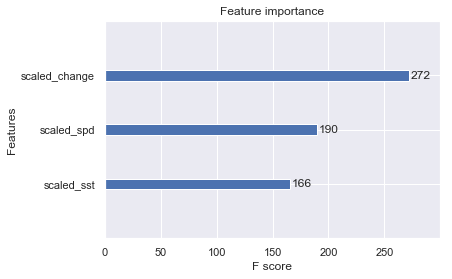

In [117]:
import xgboost
xgboost.plot_importance(xgb)

In [180]:
lgb = XGBClassifier(objective='binary:logistic', silent=True, nthread=1)
grid = GridSearchCV(estimator=lgb, param_grid=params, scoring='roc_auc', n_jobs=4, cv=3, verbose=0)
grid.fit(X_train1, y_train1)
print('\n Best estimator:')
print(grid.best_estimator_)
print('\n Best score:')
print(grid.best_score_ * 2 - 1)
print('\n Best parameters:')
print(grid.best_params_)
results = pd.DataFrame(grid.cv_results_)


 Best estimator:
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1.0, gamma=0.1366666666666667, learning_rate=0.02,
       max_delta_step=0, max_depth=5, min_child_weight=1, missing=None,
       n_estimators=800, n_jobs=1, nthread=1, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.6)

 Best score:
0.9559623448066896

 Best parameters:
{'colsample_bytree': 1.0, 'gamma': 0.1366666666666667, 'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 800, 'subsample': 0.6}


In [86]:
xgb1 = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1.0, gamma=0.1366666666666667, learning_rate=0.02,
       max_delta_step=0, max_depth=5, min_child_weight=1, missing=None,
       n_estimators=800, n_jobs=1, nthread=1, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.6)

xgb1.fit(X_train1, y_train1)
train_preds1 = xgb1.predict(X_train1)
xgb_preds1 = xgb1.predict(X_test1)
print('XGBoost Test Score:', xgb1.score(X_test1, y_test1), '\n')
print('XGBoost Feature Importances:', xgb1.feature_importances_, '\n')
print(confusion_matrix(y_train1, train_preds1), '\n')
confusion_matrix(y_test1, xgb_preds1)

XGBoost Test Score: 0.9377271625878362 

XGBoost Feature Importances: [0.36978835 0.3185271  0.31168455] 

[[7830  407]
 [ 408 7862]] 



array([[1972,  108],
       [ 149, 1898]], dtype=int64)

In [185]:
results.sort_values(by='mean_test_score', ascending=False).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_colsample_bytree,param_gamma,param_learning_rate,param_max_depth,param_n_estimators,param_subsample,...,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
2913,7.323979,0.032835,0.248102,0.003005,1,0.136667,0.02,5,800,0.6,...,0.979836,0.976483,0.977981,0.001392,1,0.990542,0.990283,0.990849,0.990558,0.000231
2265,7.471149,0.100301,0.274136,0.006509,1,0.01,0.02,5,800,0.6,...,0.979794,0.976458,0.977947,0.001385,2,0.990598,0.990300,0.990875,0.990591,0.000235
3237,7.226996,0.097323,0.253604,0.009721,1,0.2,0.02,5,800,0.6,...,0.979774,0.976382,0.977943,0.001398,3,0.990560,0.990244,0.990877,0.990560,0.000258
2805,7.308569,0.037602,0.253824,0.010274,1,0.115556,0.02,5,800,0.6,...,0.979758,0.976392,0.977938,0.001388,4,0.990666,0.990322,0.990868,0.990619,0.000226
3021,7.243057,0.035922,0.260870,0.003906,1,0.157778,0.02,5,800,0.6,...,0.979806,0.976391,0.977931,0.001414,5,0.990616,0.990190,0.990835,0.990547,0.000268


In [187]:
results.iloc[2913]['params']

{'colsample_bytree': 1.0,
 'gamma': 0.1366666666666667,
 'learning_rate': 0.02,
 'max_depth': 5,
 'n_estimators': 800,
 'subsample': 0.6}

### LightGBM

In [87]:
from lightgbm import LGBMClassifier
lgb = LGBMClassifier()

In [199]:
from lightgbm import LGBMClassifier
lgb = LGBMClassifier()
grid = GridSearchCV(estimator=lgb, param_grid=params, scoring='roc_auc', n_jobs=4, cv=3, verbose=0)
grid.fit(X_train1, y_train1)
print('\n Best estimator:')
print(grid.best_estimator_)
print('\n Best score:')
print(grid.best_score_ * 2 - 1)
print('\n Best parameters:')
print(grid.best_params_)
results = pd.DataFrame(grid.cv_results_)


 Best estimator:
LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        gamma=0.01, importance_type='split', learning_rate=0.02,
        max_depth=5, min_child_samples=20, min_child_weight=0.001,
        min_split_gain=0.0, n_estimators=800, n_jobs=-1, num_leaves=31,
        objective=None, random_state=None, reg_alpha=0.0, reg_lambda=0.0,
        silent=True, subsample=0.6, subsample_for_bin=200000,
        subsample_freq=0)

 Best score:
0.9542084186494146

 Best parameters:
{'colsample_bytree': 1.0, 'gamma': 0.01, 'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 800, 'subsample': 0.6}


In [88]:
lgb1 = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        gamma=0.01, importance_type='split', learning_rate=0.02,
        max_depth=5, min_child_samples=20, min_child_weight=0.001,
        min_split_gain=0.0, n_estimators=800, n_jobs=-1, num_leaves=31,
        objective=None, random_state=None, reg_alpha=0.0, reg_lambda=0.0,
        silent=True, subsample=0.6, subsample_for_bin=200000,
        subsample_freq=0)
lgb1.fit(X_train1, y_train1)
lgb_pred1 = lgb1.predict(X_test1)
print('Accuracy:',lgb1.score(X_test1, y_test1))
print(confusion_matrix(y_test1, lgb_pred1))

Accuracy: 0.9379694693481948
[[1970  110]
 [ 146 1901]]


In [32]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

reduc_estimator = lgb.LGBMClassifier(learning_rate = 0.125, metric = 'l1', 
                        n_estimators = 20, num_leaves = 38)

# Parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [x for x in range(20, 36, 2)],
    'learning_rate': [0.10, 0.125, 0.15, 0.175, 0.2]}

gridsearch = GridSearchCV(reduc_estimator, param_grid)

gridsearch.fit(X_train, y_train,
        eval_set = [(X_test, y_test)],
        eval_metric = ['auc', 'binary_logloss'],
        early_stopping_rounds = 5)
print('Best parameters found by grid search are:', gridsearch.best_params_, '\n')

[1]	valid_0's auc: 0.954293	valid_0's l1: 0.463721	valid_0's binary_logloss: 0.624087
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.956156	valid_0's l1: 0.431358	valid_0's binary_logloss: 0.567798
[3]	valid_0's auc: 0.964151	valid_0's l1: 0.401488	valid_0's binary_logloss: 0.519355
[4]	valid_0's auc: 0.96614	valid_0's l1: 0.374833	valid_0's binary_logloss: 0.479005
[5]	valid_0's auc: 0.966601	valid_0's l1: 0.351231	valid_0's binary_logloss: 0.445374
[6]	valid_0's auc: 0.968108	valid_0's l1: 0.329637	valid_0's binary_logloss: 0.415897
[7]	valid_0's auc: 0.969023	valid_0's l1: 0.309786	valid_0's binary_logloss: 0.389769
[8]	valid_0's auc: 0.969085	valid_0's l1: 0.292272	valid_0's binary_logloss: 0.368088
[9]	valid_0's auc: 0.969469	valid_0's l1: 0.276561	valid_0's binary_logloss: 0.349448
[10]	valid_0's auc: 0.969866	valid_0's l1: 0.261715	valid_0's binary_logloss: 0.331819
[11]	valid_0's auc: 0.971139	valid_0's l1: 0.248523	valid_0's binary_logloss: 0

[9]	valid_0's auc: 0.969444	valid_0's l1: 0.277449	valid_0's binary_logloss: 0.350225
[10]	valid_0's auc: 0.970007	valid_0's l1: 0.262782	valid_0's binary_logloss: 0.332921
[11]	valid_0's auc: 0.970464	valid_0's l1: 0.249759	valid_0's binary_logloss: 0.318231
[12]	valid_0's auc: 0.97073	valid_0's l1: 0.237715	valid_0's binary_logloss: 0.305006
[13]	valid_0's auc: 0.971047	valid_0's l1: 0.226519	valid_0's binary_logloss: 0.292628
[14]	valid_0's auc: 0.971142	valid_0's l1: 0.216403	valid_0's binary_logloss: 0.281949
[15]	valid_0's auc: 0.971519	valid_0's l1: 0.207128	valid_0's binary_logloss: 0.272387
[16]	valid_0's auc: 0.972484	valid_0's l1: 0.199162	valid_0's binary_logloss: 0.264338
[17]	valid_0's auc: 0.973389	valid_0's l1: 0.191964	valid_0's binary_logloss: 0.25716
[18]	valid_0's auc: 0.973835	valid_0's l1: 0.185164	valid_0's binary_logloss: 0.250265
[19]	valid_0's auc: 0.974458	valid_0's l1: 0.179102	valid_0's binary_logloss: 0.244028
[20]	valid_0's auc: 0.974686	valid_0's l1: 0.1

[7]	valid_0's auc: 0.969023	valid_0's l1: 0.309786	valid_0's binary_logloss: 0.389769
[8]	valid_0's auc: 0.969085	valid_0's l1: 0.292272	valid_0's binary_logloss: 0.368088
[9]	valid_0's auc: 0.969469	valid_0's l1: 0.276561	valid_0's binary_logloss: 0.349448
[10]	valid_0's auc: 0.969866	valid_0's l1: 0.261715	valid_0's binary_logloss: 0.331819
[11]	valid_0's auc: 0.971139	valid_0's l1: 0.248523	valid_0's binary_logloss: 0.316818
[12]	valid_0's auc: 0.971689	valid_0's l1: 0.236604	valid_0's binary_logloss: 0.303845
[13]	valid_0's auc: 0.971995	valid_0's l1: 0.22588	valid_0's binary_logloss: 0.292634
[14]	valid_0's auc: 0.972627	valid_0's l1: 0.215865	valid_0's binary_logloss: 0.281823
[15]	valid_0's auc: 0.972723	valid_0's l1: 0.20686	valid_0's binary_logloss: 0.272596
[16]	valid_0's auc: 0.973232	valid_0's l1: 0.198376	valid_0's binary_logloss: 0.263607
[17]	valid_0's auc: 0.973357	valid_0's l1: 0.190892	valid_0's binary_logloss: 0.256302
[18]	valid_0's auc: 0.973617	valid_0's l1: 0.184

[1]	valid_0's auc: 0.953889	valid_0's l1: 0.464227	valid_0's binary_logloss: 0.625048
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.955911	valid_0's l1: 0.431899	valid_0's binary_logloss: 0.56878
[3]	valid_0's auc: 0.962117	valid_0's l1: 0.402634	valid_0's binary_logloss: 0.521357
[4]	valid_0's auc: 0.965772	valid_0's l1: 0.375978	valid_0's binary_logloss: 0.480845
[5]	valid_0's auc: 0.96754	valid_0's l1: 0.351588	valid_0's binary_logloss: 0.445443
[6]	valid_0's auc: 0.967181	valid_0's l1: 0.330039	valid_0's binary_logloss: 0.416206
[7]	valid_0's auc: 0.967341	valid_0's l1: 0.310605	valid_0's binary_logloss: 0.390944
[8]	valid_0's auc: 0.968583	valid_0's l1: 0.292828	valid_0's binary_logloss: 0.368549
[9]	valid_0's auc: 0.968915	valid_0's l1: 0.277111	valid_0's binary_logloss: 0.349696
[10]	valid_0's auc: 0.969414	valid_0's l1: 0.262985	valid_0's binary_logloss: 0.333387
[11]	valid_0's auc: 0.969836	valid_0's l1: 0.249932	valid_0's binary_logloss: 0.

[3]	valid_0's auc: 0.964926	valid_0's l1: 0.401382	valid_0's binary_logloss: 0.51899
[4]	valid_0's auc: 0.965315	valid_0's l1: 0.375064	valid_0's binary_logloss: 0.4792
[5]	valid_0's auc: 0.967085	valid_0's l1: 0.351329	valid_0's binary_logloss: 0.445164
[6]	valid_0's auc: 0.967632	valid_0's l1: 0.330143	valid_0's binary_logloss: 0.416387
[7]	valid_0's auc: 0.967904	valid_0's l1: 0.31067	valid_0's binary_logloss: 0.391052
[8]	valid_0's auc: 0.96813	valid_0's l1: 0.293081	valid_0's binary_logloss: 0.369
[9]	valid_0's auc: 0.969444	valid_0's l1: 0.277449	valid_0's binary_logloss: 0.350225
[10]	valid_0's auc: 0.970007	valid_0's l1: 0.262782	valid_0's binary_logloss: 0.332921
[11]	valid_0's auc: 0.970464	valid_0's l1: 0.249759	valid_0's binary_logloss: 0.318231
[12]	valid_0's auc: 0.97073	valid_0's l1: 0.237715	valid_0's binary_logloss: 0.305006
[13]	valid_0's auc: 0.971047	valid_0's l1: 0.226519	valid_0's binary_logloss: 0.292628
[14]	valid_0's auc: 0.971142	valid_0's l1: 0.216403	valid_0

[3]	valid_0's auc: 0.964926	valid_0's l1: 0.401382	valid_0's binary_logloss: 0.51899
[4]	valid_0's auc: 0.965315	valid_0's l1: 0.375064	valid_0's binary_logloss: 0.4792
[5]	valid_0's auc: 0.967085	valid_0's l1: 0.351329	valid_0's binary_logloss: 0.445164
[6]	valid_0's auc: 0.967632	valid_0's l1: 0.330143	valid_0's binary_logloss: 0.416387
[7]	valid_0's auc: 0.967904	valid_0's l1: 0.31067	valid_0's binary_logloss: 0.391052
[8]	valid_0's auc: 0.96813	valid_0's l1: 0.293081	valid_0's binary_logloss: 0.369
[9]	valid_0's auc: 0.969444	valid_0's l1: 0.277449	valid_0's binary_logloss: 0.350225
[10]	valid_0's auc: 0.970007	valid_0's l1: 0.262782	valid_0's binary_logloss: 0.332921
[11]	valid_0's auc: 0.970464	valid_0's l1: 0.249759	valid_0's binary_logloss: 0.318231
[12]	valid_0's auc: 0.97073	valid_0's l1: 0.237715	valid_0's binary_logloss: 0.305006
[13]	valid_0's auc: 0.971047	valid_0's l1: 0.226519	valid_0's binary_logloss: 0.292628
[14]	valid_0's auc: 0.971142	valid_0's l1: 0.216403	valid_0

[2]	valid_0's auc: 0.964413	valid_0's l1: 0.430577	valid_0's binary_logloss: 0.56618
[3]	valid_0's auc: 0.964926	valid_0's l1: 0.401382	valid_0's binary_logloss: 0.51899
[4]	valid_0's auc: 0.965315	valid_0's l1: 0.375064	valid_0's binary_logloss: 0.4792
[5]	valid_0's auc: 0.967085	valid_0's l1: 0.351329	valid_0's binary_logloss: 0.445164
[6]	valid_0's auc: 0.967632	valid_0's l1: 0.330143	valid_0's binary_logloss: 0.416387
[7]	valid_0's auc: 0.967904	valid_0's l1: 0.31067	valid_0's binary_logloss: 0.391052
[8]	valid_0's auc: 0.96813	valid_0's l1: 0.293081	valid_0's binary_logloss: 0.369
[9]	valid_0's auc: 0.969444	valid_0's l1: 0.277449	valid_0's binary_logloss: 0.350225
[10]	valid_0's auc: 0.970007	valid_0's l1: 0.262782	valid_0's binary_logloss: 0.332921
[11]	valid_0's auc: 0.970464	valid_0's l1: 0.249759	valid_0's binary_logloss: 0.318231
[12]	valid_0's auc: 0.97073	valid_0's l1: 0.237715	valid_0's binary_logloss: 0.305006
[13]	valid_0's auc: 0.971047	valid_0's l1: 0.226519	valid_0's

[1]	valid_0's auc: 0.954293	valid_0's l1: 0.454719	valid_0's binary_logloss: 0.607969
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.95624	valid_0's l1: 0.415544	valid_0's binary_logloss: 0.541942
[3]	valid_0's auc: 0.964818	valid_0's l1: 0.380378	valid_0's binary_logloss: 0.487312
[4]	valid_0's auc: 0.966619	valid_0's l1: 0.349705	valid_0's binary_logloss: 0.443169
[5]	valid_0's auc: 0.967289	valid_0's l1: 0.322958	valid_0's binary_logloss: 0.406889
[6]	valid_0's auc: 0.969082	valid_0's l1: 0.299159	valid_0's binary_logloss: 0.376203
[7]	valid_0's auc: 0.969416	valid_0's l1: 0.278563	valid_0's binary_logloss: 0.351204
[8]	valid_0's auc: 0.969858	valid_0's l1: 0.259871	valid_0's binary_logloss: 0.329163
[9]	valid_0's auc: 0.971153	valid_0's l1: 0.2441	valid_0's binary_logloss: 0.311604
[10]	valid_0's auc: 0.971915	valid_0's l1: 0.229978	valid_0's binary_logloss: 0.296368
[11]	valid_0's auc: 0.972175	valid_0's l1: 0.217328	valid_0's binary_logloss: 0.2

[16]	valid_0's auc: 0.974277	valid_0's l1: 0.172957	valid_0's binary_logloss: 0.238096
[17]	valid_0's auc: 0.97472	valid_0's l1: 0.166388	valid_0's binary_logloss: 0.231214
[18]	valid_0's auc: 0.975028	valid_0's l1: 0.160619	valid_0's binary_logloss: 0.225675
[19]	valid_0's auc: 0.974994	valid_0's l1: 0.155619	valid_0's binary_logloss: 0.22107
[20]	valid_0's auc: 0.975004	valid_0's l1: 0.151521	valid_0's binary_logloss: 0.217726
[21]	valid_0's auc: 0.975353	valid_0's l1: 0.147641	valid_0's binary_logloss: 0.21424
[22]	valid_0's auc: 0.975535	valid_0's l1: 0.143777	valid_0's binary_logloss: 0.211021
[23]	valid_0's auc: 0.975759	valid_0's l1: 0.140047	valid_0's binary_logloss: 0.207575
[24]	valid_0's auc: 0.975961	valid_0's l1: 0.136728	valid_0's binary_logloss: 0.204512
Did not meet early stopping. Best iteration is:
[24]	valid_0's auc: 0.975961	valid_0's l1: 0.136728	valid_0's binary_logloss: 0.204512
[1]	valid_0's auc: 0.962521	valid_0's l1: 0.454127	valid_0's binary_logloss: 0.606811

[4]	valid_0's auc: 0.965607	valid_0's l1: 0.350137	valid_0's binary_logloss: 0.443716
[5]	valid_0's auc: 0.967657	valid_0's l1: 0.323545	valid_0's binary_logloss: 0.407692
[6]	valid_0's auc: 0.968242	valid_0's l1: 0.300132	valid_0's binary_logloss: 0.377627
[7]	valid_0's auc: 0.969661	valid_0's l1: 0.279771	valid_0's binary_logloss: 0.35287
[8]	valid_0's auc: 0.969926	valid_0's l1: 0.261503	valid_0's binary_logloss: 0.331763
[9]	valid_0's auc: 0.970582	valid_0's l1: 0.2453	valid_0's binary_logloss: 0.313373
[10]	valid_0's auc: 0.971126	valid_0's l1: 0.230536	valid_0's binary_logloss: 0.296706
[11]	valid_0's auc: 0.971469	valid_0's l1: 0.217791	valid_0's binary_logloss: 0.283389
[12]	valid_0's auc: 0.971802	valid_0's l1: 0.206078	valid_0's binary_logloss: 0.271233
[13]	valid_0's auc: 0.973041	valid_0's l1: 0.196223	valid_0's binary_logloss: 0.260732
[14]	valid_0's auc: 0.97308	valid_0's l1: 0.18769	valid_0's binary_logloss: 0.252741
[15]	valid_0's auc: 0.973838	valid_0's l1: 0.180161	va

[19]	valid_0's auc: 0.975505	valid_0's l1: 0.156024	valid_0's binary_logloss: 0.222117
[20]	valid_0's auc: 0.975763	valid_0's l1: 0.15087	valid_0's binary_logloss: 0.217252
[21]	valid_0's auc: 0.975941	valid_0's l1: 0.146849	valid_0's binary_logloss: 0.21374
[22]	valid_0's auc: 0.976186	valid_0's l1: 0.142893	valid_0's binary_logloss: 0.210217
[23]	valid_0's auc: 0.976453	valid_0's l1: 0.139847	valid_0's binary_logloss: 0.207422
[24]	valid_0's auc: 0.97663	valid_0's l1: 0.13722	valid_0's binary_logloss: 0.205041
[25]	valid_0's auc: 0.976683	valid_0's l1: 0.134522	valid_0's binary_logloss: 0.202688
[26]	valid_0's auc: 0.976934	valid_0's l1: 0.132142	valid_0's binary_logloss: 0.200394
[27]	valid_0's auc: 0.977207	valid_0's l1: 0.129991	valid_0's binary_logloss: 0.198365
[28]	valid_0's auc: 0.977408	valid_0's l1: 0.128105	valid_0's binary_logloss: 0.19676
Did not meet early stopping. Best iteration is:
[28]	valid_0's auc: 0.977408	valid_0's l1: 0.128105	valid_0's binary_logloss: 0.19676
[

[23]	valid_0's auc: 0.976453	valid_0's l1: 0.139847	valid_0's binary_logloss: 0.207422
[24]	valid_0's auc: 0.97663	valid_0's l1: 0.13722	valid_0's binary_logloss: 0.205041
[25]	valid_0's auc: 0.976683	valid_0's l1: 0.134522	valid_0's binary_logloss: 0.202688
[26]	valid_0's auc: 0.976934	valid_0's l1: 0.132142	valid_0's binary_logloss: 0.200394
[27]	valid_0's auc: 0.977207	valid_0's l1: 0.129991	valid_0's binary_logloss: 0.198365
[28]	valid_0's auc: 0.977408	valid_0's l1: 0.128105	valid_0's binary_logloss: 0.19676
[29]	valid_0's auc: 0.977504	valid_0's l1: 0.126243	valid_0's binary_logloss: 0.195093
[30]	valid_0's auc: 0.977518	valid_0's l1: 0.124455	valid_0's binary_logloss: 0.193585
Did not meet early stopping. Best iteration is:
[30]	valid_0's auc: 0.977518	valid_0's l1: 0.124455	valid_0's binary_logloss: 0.193585
[1]	valid_0's auc: 0.954293	valid_0's l1: 0.454719	valid_0's binary_logloss: 0.607969
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.9562

[26]	valid_0's auc: 0.976934	valid_0's l1: 0.132142	valid_0's binary_logloss: 0.200394
[27]	valid_0's auc: 0.977207	valid_0's l1: 0.129991	valid_0's binary_logloss: 0.198365
[28]	valid_0's auc: 0.977408	valid_0's l1: 0.128105	valid_0's binary_logloss: 0.19676
[29]	valid_0's auc: 0.977504	valid_0's l1: 0.126243	valid_0's binary_logloss: 0.195093
[30]	valid_0's auc: 0.977518	valid_0's l1: 0.124455	valid_0's binary_logloss: 0.193585
[31]	valid_0's auc: 0.97779	valid_0's l1: 0.123029	valid_0's binary_logloss: 0.19214
[32]	valid_0's auc: 0.977992	valid_0's l1: 0.121919	valid_0's binary_logloss: 0.191031
Did not meet early stopping. Best iteration is:
[32]	valid_0's auc: 0.977992	valid_0's l1: 0.121919	valid_0's binary_logloss: 0.191031
[1]	valid_0's auc: 0.954293	valid_0's l1: 0.454719	valid_0's binary_logloss: 0.607969
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.95624	valid_0's l1: 0.415544	valid_0's binary_logloss: 0.541942
[3]	valid_0's auc: 0.964818

[26]	valid_0's auc: 0.976934	valid_0's l1: 0.132142	valid_0's binary_logloss: 0.200394
[27]	valid_0's auc: 0.977207	valid_0's l1: 0.129991	valid_0's binary_logloss: 0.198365
[28]	valid_0's auc: 0.977408	valid_0's l1: 0.128105	valid_0's binary_logloss: 0.19676
[29]	valid_0's auc: 0.977504	valid_0's l1: 0.126243	valid_0's binary_logloss: 0.195093
[30]	valid_0's auc: 0.977518	valid_0's l1: 0.124455	valid_0's binary_logloss: 0.193585
[31]	valid_0's auc: 0.97779	valid_0's l1: 0.123029	valid_0's binary_logloss: 0.19214
[32]	valid_0's auc: 0.977992	valid_0's l1: 0.121919	valid_0's binary_logloss: 0.191031
[33]	valid_0's auc: 0.978211	valid_0's l1: 0.120579	valid_0's binary_logloss: 0.189648
[34]	valid_0's auc: 0.9784	valid_0's l1: 0.119303	valid_0's binary_logloss: 0.188452
Did not meet early stopping. Best iteration is:
[34]	valid_0's auc: 0.9784	valid_0's l1: 0.119303	valid_0's binary_logloss: 0.188452
[1]	valid_0's auc: 0.954293	valid_0's l1: 0.445763	valid_0's binary_logloss: 0.592308
Tra

[1]	valid_0's auc: 0.953889	valid_0's l1: 0.446517	valid_0's binary_logloss: 0.593709
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.956727	valid_0's l1: 0.400615	valid_0's binary_logloss: 0.518407
[3]	valid_0's auc: 0.967335	valid_0's l1: 0.360755	valid_0's binary_logloss: 0.458371
[4]	valid_0's auc: 0.968139	valid_0's l1: 0.328259	valid_0's binary_logloss: 0.414015
[5]	valid_0's auc: 0.968964	valid_0's l1: 0.299535	valid_0's binary_logloss: 0.37679
[6]	valid_0's auc: 0.969228	valid_0's l1: 0.275538	valid_0's binary_logloss: 0.348003
[7]	valid_0's auc: 0.969418	valid_0's l1: 0.254069	valid_0's binary_logloss: 0.32326
[8]	valid_0's auc: 0.969965	valid_0's l1: 0.235523	valid_0's binary_logloss: 0.302526
[9]	valid_0's auc: 0.970764	valid_0's l1: 0.219506	valid_0's binary_logloss: 0.285334
[10]	valid_0's auc: 0.971041	valid_0's l1: 0.205326	valid_0's binary_logloss: 0.270694
[11]	valid_0's auc: 0.972427	valid_0's l1: 0.193753	valid_0's binary_logloss: 0.

[1]	valid_0's auc: 0.954293	valid_0's l1: 0.445763	valid_0's binary_logloss: 0.592308
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.962397	valid_0's l1: 0.399816	valid_0's binary_logloss: 0.517006
[3]	valid_0's auc: 0.964063	valid_0's l1: 0.361344	valid_0's binary_logloss: 0.460199
[4]	valid_0's auc: 0.967472	valid_0's l1: 0.327784	valid_0's binary_logloss: 0.413835
[5]	valid_0's auc: 0.969147	valid_0's l1: 0.298414	valid_0's binary_logloss: 0.375644
[6]	valid_0's auc: 0.970322	valid_0's l1: 0.273561	valid_0's binary_logloss: 0.345211
[7]	valid_0's auc: 0.970487	valid_0's l1: 0.252759	valid_0's binary_logloss: 0.32164
[8]	valid_0's auc: 0.972278	valid_0's l1: 0.234936	valid_0's binary_logloss: 0.302206
[9]	valid_0's auc: 0.972796	valid_0's l1: 0.219007	valid_0's binary_logloss: 0.285054
[10]	valid_0's auc: 0.973354	valid_0's l1: 0.204819	valid_0's binary_logloss: 0.269922
[11]	valid_0's auc: 0.973532	valid_0's l1: 0.193374	valid_0's binary_logloss: 0

[1]	valid_0's auc: 0.953889	valid_0's l1: 0.446517	valid_0's binary_logloss: 0.593709
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.956727	valid_0's l1: 0.400615	valid_0's binary_logloss: 0.518407
[3]	valid_0's auc: 0.967335	valid_0's l1: 0.360755	valid_0's binary_logloss: 0.458371
[4]	valid_0's auc: 0.968139	valid_0's l1: 0.328259	valid_0's binary_logloss: 0.414015
[5]	valid_0's auc: 0.968964	valid_0's l1: 0.299535	valid_0's binary_logloss: 0.37679
[6]	valid_0's auc: 0.969228	valid_0's l1: 0.275538	valid_0's binary_logloss: 0.348003
[7]	valid_0's auc: 0.969418	valid_0's l1: 0.254069	valid_0's binary_logloss: 0.32326
[8]	valid_0's auc: 0.969965	valid_0's l1: 0.235523	valid_0's binary_logloss: 0.302526
[9]	valid_0's auc: 0.970764	valid_0's l1: 0.219506	valid_0's binary_logloss: 0.285334
[10]	valid_0's auc: 0.971041	valid_0's l1: 0.205326	valid_0's binary_logloss: 0.270694
[11]	valid_0's auc: 0.972427	valid_0's l1: 0.193753	valid_0's binary_logloss: 0.

[5]	valid_0's auc: 0.968964	valid_0's l1: 0.299535	valid_0's binary_logloss: 0.37679
[6]	valid_0's auc: 0.969228	valid_0's l1: 0.275538	valid_0's binary_logloss: 0.348003
[7]	valid_0's auc: 0.969418	valid_0's l1: 0.254069	valid_0's binary_logloss: 0.32326
[8]	valid_0's auc: 0.969965	valid_0's l1: 0.235523	valid_0's binary_logloss: 0.302526
[9]	valid_0's auc: 0.970764	valid_0's l1: 0.219506	valid_0's binary_logloss: 0.285334
[10]	valid_0's auc: 0.971041	valid_0's l1: 0.205326	valid_0's binary_logloss: 0.270694
[11]	valid_0's auc: 0.972427	valid_0's l1: 0.193753	valid_0's binary_logloss: 0.258843
[12]	valid_0's auc: 0.972861	valid_0's l1: 0.183791	valid_0's binary_logloss: 0.249307
[13]	valid_0's auc: 0.973719	valid_0's l1: 0.174959	valid_0's binary_logloss: 0.240445
[14]	valid_0's auc: 0.974012	valid_0's l1: 0.167425	valid_0's binary_logloss: 0.233639
[15]	valid_0's auc: 0.974615	valid_0's l1: 0.160811	valid_0's binary_logloss: 0.227465
[16]	valid_0's auc: 0.975409	valid_0's l1: 0.15419

[13]	valid_0's auc: 0.973719	valid_0's l1: 0.174959	valid_0's binary_logloss: 0.240445
[14]	valid_0's auc: 0.974012	valid_0's l1: 0.167425	valid_0's binary_logloss: 0.233639
[15]	valid_0's auc: 0.974615	valid_0's l1: 0.160811	valid_0's binary_logloss: 0.227465
[16]	valid_0's auc: 0.975409	valid_0's l1: 0.154198	valid_0's binary_logloss: 0.220227
[17]	valid_0's auc: 0.975544	valid_0's l1: 0.148892	valid_0's binary_logloss: 0.215361
[18]	valid_0's auc: 0.97566	valid_0's l1: 0.144531	valid_0's binary_logloss: 0.21166
[19]	valid_0's auc: 0.97593	valid_0's l1: 0.140525	valid_0's binary_logloss: 0.208104
[20]	valid_0's auc: 0.976458	valid_0's l1: 0.13652	valid_0's binary_logloss: 0.204048
[21]	valid_0's auc: 0.976693	valid_0's l1: 0.133099	valid_0's binary_logloss: 0.200882
[22]	valid_0's auc: 0.976693	valid_0's l1: 0.130559	valid_0's binary_logloss: 0.198796
[23]	valid_0's auc: 0.97725	valid_0's l1: 0.127588	valid_0's binary_logloss: 0.195528
[24]	valid_0's auc: 0.977456	valid_0's l1: 0.125

[1]	valid_0's auc: 0.962521	valid_0's l1: 0.445058	valid_0's binary_logloss: 0.59093
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.9641	valid_0's l1: 0.399511	valid_0's binary_logloss: 0.516218
[3]	valid_0's auc: 0.966127	valid_0's l1: 0.360803	valid_0's binary_logloss: 0.458563
[4]	valid_0's auc: 0.967561	valid_0's l1: 0.327401	valid_0's binary_logloss: 0.412612
[5]	valid_0's auc: 0.967206	valid_0's l1: 0.299299	valid_0's binary_logloss: 0.37676
[6]	valid_0's auc: 0.969054	valid_0's l1: 0.275141	valid_0's binary_logloss: 0.347545
[7]	valid_0's auc: 0.969782	valid_0's l1: 0.253563	valid_0's binary_logloss: 0.322446
[8]	valid_0's auc: 0.970006	valid_0's l1: 0.235738	valid_0's binary_logloss: 0.303182
[9]	valid_0's auc: 0.970693	valid_0's l1: 0.219311	valid_0's binary_logloss: 0.28505
[10]	valid_0's auc: 0.971436	valid_0's l1: 0.205879	valid_0's binary_logloss: 0.271369
[11]	valid_0's auc: 0.972532	valid_0's l1: 0.194076	valid_0's binary_logloss: 0.259

[17]	valid_0's auc: 0.976287	valid_0's l1: 0.134513	valid_0's binary_logloss: 0.204115
[18]	valid_0's auc: 0.976539	valid_0's l1: 0.131024	valid_0's binary_logloss: 0.201064
[19]	valid_0's auc: 0.977055	valid_0's l1: 0.127497	valid_0's binary_logloss: 0.197404
[20]	valid_0's auc: 0.977385	valid_0's l1: 0.124463	valid_0's binary_logloss: 0.194506
[21]	valid_0's auc: 0.977732	valid_0's l1: 0.121929	valid_0's binary_logloss: 0.191932
[22]	valid_0's auc: 0.977803	valid_0's l1: 0.12031	valid_0's binary_logloss: 0.191106
Did not meet early stopping. Best iteration is:
[22]	valid_0's auc: 0.977803	valid_0's l1: 0.12031	valid_0's binary_logloss: 0.191106
[1]	valid_0's auc: 0.953889	valid_0's l1: 0.437737	valid_0's binary_logloss: 0.578713
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.962054	valid_0's l1: 0.386061	valid_0's binary_logloss: 0.496017
[3]	valid_0's auc: 0.964162	valid_0's l1: 0.343961	valid_0's binary_logloss: 0.436047
[4]	valid_0's auc: 0.96880

[10]	valid_0's auc: 0.972551	valid_0's l1: 0.186056	valid_0's binary_logloss: 0.251293
[11]	valid_0's auc: 0.973335	valid_0's l1: 0.17579	valid_0's binary_logloss: 0.241179
[12]	valid_0's auc: 0.974356	valid_0's l1: 0.166175	valid_0's binary_logloss: 0.231479
[13]	valid_0's auc: 0.974909	valid_0's l1: 0.158378	valid_0's binary_logloss: 0.224294
[14]	valid_0's auc: 0.975492	valid_0's l1: 0.151853	valid_0's binary_logloss: 0.217816
[15]	valid_0's auc: 0.976262	valid_0's l1: 0.145753	valid_0's binary_logloss: 0.211539
[16]	valid_0's auc: 0.976869	valid_0's l1: 0.14052	valid_0's binary_logloss: 0.206293
[17]	valid_0's auc: 0.977438	valid_0's l1: 0.136462	valid_0's binary_logloss: 0.202316
[18]	valid_0's auc: 0.977592	valid_0's l1: 0.132629	valid_0's binary_logloss: 0.198692
[19]	valid_0's auc: 0.97769	valid_0's l1: 0.129338	valid_0's binary_logloss: 0.195945
[20]	valid_0's auc: 0.977907	valid_0's l1: 0.126518	valid_0's binary_logloss: 0.193566
[21]	valid_0's auc: 0.97822	valid_0's l1: 0.12

[26]	valid_0's auc: 0.97855	valid_0's l1: 0.114773	valid_0's binary_logloss: 0.186216
[27]	valid_0's auc: 0.978614	valid_0's l1: 0.114299	valid_0's binary_logloss: 0.185821
[28]	valid_0's auc: 0.978593	valid_0's l1: 0.113707	valid_0's binary_logloss: 0.185544
Did not meet early stopping. Best iteration is:
[27]	valid_0's auc: 0.978614	valid_0's l1: 0.114299	valid_0's binary_logloss: 0.185821
[1]	valid_0's auc: 0.953889	valid_0's l1: 0.437737	valid_0's binary_logloss: 0.578713
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.962054	valid_0's l1: 0.386061	valid_0's binary_logloss: 0.496017
[3]	valid_0's auc: 0.964162	valid_0's l1: 0.343961	valid_0's binary_logloss: 0.436047
[4]	valid_0's auc: 0.968801	valid_0's l1: 0.307356	valid_0's binary_logloss: 0.386617
[5]	valid_0's auc: 0.968918	valid_0's l1: 0.278255	valid_0's binary_logloss: 0.351074
[6]	valid_0's auc: 0.9694	valid_0's l1: 0.253767	valid_0's binary_logloss: 0.323161
[7]	valid_0's auc: 0.97029	val

[2]	valid_0's auc: 0.962054	valid_0's l1: 0.386061	valid_0's binary_logloss: 0.496017
[3]	valid_0's auc: 0.964162	valid_0's l1: 0.343961	valid_0's binary_logloss: 0.436047
[4]	valid_0's auc: 0.968801	valid_0's l1: 0.307356	valid_0's binary_logloss: 0.386617
[5]	valid_0's auc: 0.968918	valid_0's l1: 0.278255	valid_0's binary_logloss: 0.351074
[6]	valid_0's auc: 0.9694	valid_0's l1: 0.253767	valid_0's binary_logloss: 0.323161
[7]	valid_0's auc: 0.97029	valid_0's l1: 0.232182	valid_0's binary_logloss: 0.299168
[8]	valid_0's auc: 0.97109	valid_0's l1: 0.214606	valid_0's binary_logloss: 0.280507
[9]	valid_0's auc: 0.971554	valid_0's l1: 0.199277	valid_0's binary_logloss: 0.264768
[10]	valid_0's auc: 0.972223	valid_0's l1: 0.186467	valid_0's binary_logloss: 0.251678
[11]	valid_0's auc: 0.973506	valid_0's l1: 0.17514	valid_0's binary_logloss: 0.240093
[12]	valid_0's auc: 0.974352	valid_0's l1: 0.166005	valid_0's binary_logloss: 0.230839
[13]	valid_0's auc: 0.974852	valid_0's l1: 0.158711	vali

[2]	valid_0's auc: 0.962054	valid_0's l1: 0.386061	valid_0's binary_logloss: 0.496017
[3]	valid_0's auc: 0.964162	valid_0's l1: 0.343961	valid_0's binary_logloss: 0.436047
[4]	valid_0's auc: 0.968801	valid_0's l1: 0.307356	valid_0's binary_logloss: 0.386617
[5]	valid_0's auc: 0.968918	valid_0's l1: 0.278255	valid_0's binary_logloss: 0.351074
[6]	valid_0's auc: 0.9694	valid_0's l1: 0.253767	valid_0's binary_logloss: 0.323161
[7]	valid_0's auc: 0.97029	valid_0's l1: 0.232182	valid_0's binary_logloss: 0.299168
[8]	valid_0's auc: 0.97109	valid_0's l1: 0.214606	valid_0's binary_logloss: 0.280507
[9]	valid_0's auc: 0.971554	valid_0's l1: 0.199277	valid_0's binary_logloss: 0.264768
[10]	valid_0's auc: 0.972223	valid_0's l1: 0.186467	valid_0's binary_logloss: 0.251678
[11]	valid_0's auc: 0.973506	valid_0's l1: 0.17514	valid_0's binary_logloss: 0.240093
[12]	valid_0's auc: 0.974352	valid_0's l1: 0.166005	valid_0's binary_logloss: 0.230839
[13]	valid_0's auc: 0.974852	valid_0's l1: 0.158711	vali

[2]	valid_0's auc: 0.962054	valid_0's l1: 0.386061	valid_0's binary_logloss: 0.496017
[3]	valid_0's auc: 0.964162	valid_0's l1: 0.343961	valid_0's binary_logloss: 0.436047
[4]	valid_0's auc: 0.968801	valid_0's l1: 0.307356	valid_0's binary_logloss: 0.386617
[5]	valid_0's auc: 0.968918	valid_0's l1: 0.278255	valid_0's binary_logloss: 0.351074
[6]	valid_0's auc: 0.9694	valid_0's l1: 0.253767	valid_0's binary_logloss: 0.323161
[7]	valid_0's auc: 0.97029	valid_0's l1: 0.232182	valid_0's binary_logloss: 0.299168
[8]	valid_0's auc: 0.97109	valid_0's l1: 0.214606	valid_0's binary_logloss: 0.280507
[9]	valid_0's auc: 0.971554	valid_0's l1: 0.199277	valid_0's binary_logloss: 0.264768
[10]	valid_0's auc: 0.972223	valid_0's l1: 0.186467	valid_0's binary_logloss: 0.251678
[11]	valid_0's auc: 0.973506	valid_0's l1: 0.17514	valid_0's binary_logloss: 0.240093
[12]	valid_0's auc: 0.974352	valid_0's l1: 0.166005	valid_0's binary_logloss: 0.230839
[13]	valid_0's auc: 0.974852	valid_0's l1: 0.158711	vali

[13]	valid_0's auc: 0.97518	valid_0's l1: 0.147502	valid_0's binary_logloss: 0.215115
[14]	valid_0's auc: 0.975469	valid_0's l1: 0.141936	valid_0's binary_logloss: 0.210578
[15]	valid_0's auc: 0.976022	valid_0's l1: 0.136941	valid_0's binary_logloss: 0.20602
[16]	valid_0's auc: 0.976824	valid_0's l1: 0.131949	valid_0's binary_logloss: 0.200834
[17]	valid_0's auc: 0.977002	valid_0's l1: 0.128854	valid_0's binary_logloss: 0.198438
[18]	valid_0's auc: 0.977067	valid_0's l1: 0.126152	valid_0's binary_logloss: 0.196455
[19]	valid_0's auc: 0.977414	valid_0's l1: 0.123086	valid_0's binary_logloss: 0.193457
[20]	valid_0's auc: 0.977897	valid_0's l1: 0.120457	valid_0's binary_logloss: 0.190596
Did not meet early stopping. Best iteration is:
[20]	valid_0's auc: 0.977897	valid_0's l1: 0.120457	valid_0's binary_logloss: 0.190596
[1]	valid_0's auc: 0.962521	valid_0's l1: 0.427101	valid_0's binary_logloss: 0.560538
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.965

[1]	valid_0's auc: 0.954293	valid_0's l1: 0.428024	valid_0's binary_logloss: 0.562348
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.961945	valid_0's l1: 0.370558	valid_0's binary_logloss: 0.473258
[3]	valid_0's auc: 0.965495	valid_0's l1: 0.325479	valid_0's binary_logloss: 0.411436
[4]	valid_0's auc: 0.967817	valid_0's l1: 0.288254	valid_0's binary_logloss: 0.3641
[5]	valid_0's auc: 0.969241	valid_0's l1: 0.257076	valid_0's binary_logloss: 0.326787
[6]	valid_0's auc: 0.970937	valid_0's l1: 0.232391	valid_0's binary_logloss: 0.299663
[7]	valid_0's auc: 0.971367	valid_0's l1: 0.212392	valid_0's binary_logloss: 0.279319
[8]	valid_0's auc: 0.971919	valid_0's l1: 0.195211	valid_0's binary_logloss: 0.261502
[9]	valid_0's auc: 0.973072	valid_0's l1: 0.18051	valid_0's binary_logloss: 0.246496
[10]	valid_0's auc: 0.973942	valid_0's l1: 0.168764	valid_0's binary_logloss: 0.235197
[11]	valid_0's auc: 0.974942	valid_0's l1: 0.158848	valid_0's binary_logloss: 0.2

[21]	valid_0's auc: 0.97831	valid_0's l1: 0.118407	valid_0's binary_logloss: 0.18828
[22]	valid_0's auc: 0.978373	valid_0's l1: 0.116708	valid_0's binary_logloss: 0.187025
[23]	valid_0's auc: 0.978445	valid_0's l1: 0.115629	valid_0's binary_logloss: 0.186045
[24]	valid_0's auc: 0.978755	valid_0's l1: 0.11344	valid_0's binary_logloss: 0.183734
[25]	valid_0's auc: 0.978917	valid_0's l1: 0.112438	valid_0's binary_logloss: 0.182681
[26]	valid_0's auc: 0.978947	valid_0's l1: 0.111813	valid_0's binary_logloss: 0.182327
Did not meet early stopping. Best iteration is:
[26]	valid_0's auc: 0.978947	valid_0's l1: 0.111813	valid_0's binary_logloss: 0.182327
[1]	valid_0's auc: 0.962521	valid_0's l1: 0.427101	valid_0's binary_logloss: 0.560538
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.965035	valid_0's l1: 0.370462	valid_0's binary_logloss: 0.472455
[3]	valid_0's auc: 0.966686	valid_0's l1: 0.324414	valid_0's binary_logloss: 0.408593
[4]	valid_0's auc: 0.967202

[4]	valid_0's auc: 0.967202	valid_0's l1: 0.287335	valid_0's binary_logloss: 0.361966
[5]	valid_0's auc: 0.967614	valid_0's l1: 0.256749	valid_0's binary_logloss: 0.326156
[6]	valid_0's auc: 0.969882	valid_0's l1: 0.231995	valid_0's binary_logloss: 0.298787
[7]	valid_0's auc: 0.970547	valid_0's l1: 0.212267	valid_0's binary_logloss: 0.278771
[8]	valid_0's auc: 0.971679	valid_0's l1: 0.195923	valid_0's binary_logloss: 0.262574
[9]	valid_0's auc: 0.972974	valid_0's l1: 0.181867	valid_0's binary_logloss: 0.248558
[10]	valid_0's auc: 0.973389	valid_0's l1: 0.17097	valid_0's binary_logloss: 0.238687
[11]	valid_0's auc: 0.97428	valid_0's l1: 0.161534	valid_0's binary_logloss: 0.229283
[12]	valid_0's auc: 0.97539	valid_0's l1: 0.153109	valid_0's binary_logloss: 0.220674
[13]	valid_0's auc: 0.975986	valid_0's l1: 0.146317	valid_0's binary_logloss: 0.214413
[14]	valid_0's auc: 0.976193	valid_0's l1: 0.140681	valid_0's binary_logloss: 0.209254
[15]	valid_0's auc: 0.976416	valid_0's l1: 0.136447	

[10]	valid_0's auc: 0.973389	valid_0's l1: 0.17097	valid_0's binary_logloss: 0.238687
[11]	valid_0's auc: 0.97428	valid_0's l1: 0.161534	valid_0's binary_logloss: 0.229283
[12]	valid_0's auc: 0.97539	valid_0's l1: 0.153109	valid_0's binary_logloss: 0.220674
[13]	valid_0's auc: 0.975986	valid_0's l1: 0.146317	valid_0's binary_logloss: 0.214413
[14]	valid_0's auc: 0.976193	valid_0's l1: 0.140681	valid_0's binary_logloss: 0.209254
[15]	valid_0's auc: 0.976416	valid_0's l1: 0.136447	valid_0's binary_logloss: 0.20578
[16]	valid_0's auc: 0.976753	valid_0's l1: 0.132579	valid_0's binary_logloss: 0.202503
[17]	valid_0's auc: 0.97716	valid_0's l1: 0.129049	valid_0's binary_logloss: 0.199033
[18]	valid_0's auc: 0.977641	valid_0's l1: 0.125588	valid_0's binary_logloss: 0.195375
[19]	valid_0's auc: 0.977845	valid_0's l1: 0.122988	valid_0's binary_logloss: 0.193065
[20]	valid_0's auc: 0.978316	valid_0's l1: 0.120641	valid_0's binary_logloss: 0.190538
[21]	valid_0's auc: 0.978571	valid_0's l1: 0.118

[5]	valid_0's auc: 0.969241	valid_0's l1: 0.257076	valid_0's binary_logloss: 0.326787
[6]	valid_0's auc: 0.970937	valid_0's l1: 0.232391	valid_0's binary_logloss: 0.299663
[7]	valid_0's auc: 0.971367	valid_0's l1: 0.212392	valid_0's binary_logloss: 0.279319
[8]	valid_0's auc: 0.971919	valid_0's l1: 0.195211	valid_0's binary_logloss: 0.261502
[9]	valid_0's auc: 0.973072	valid_0's l1: 0.18051	valid_0's binary_logloss: 0.246496
[10]	valid_0's auc: 0.973942	valid_0's l1: 0.168764	valid_0's binary_logloss: 0.235197
[11]	valid_0's auc: 0.974942	valid_0's l1: 0.158848	valid_0's binary_logloss: 0.225183
[12]	valid_0's auc: 0.975542	valid_0's l1: 0.150729	valid_0's binary_logloss: 0.2179
[13]	valid_0's auc: 0.975498	valid_0's l1: 0.144287	valid_0's binary_logloss: 0.212664
[14]	valid_0's auc: 0.975758	valid_0's l1: 0.138941	valid_0's binary_logloss: 0.208329
[15]	valid_0's auc: 0.976183	valid_0's l1: 0.133754	valid_0's binary_logloss: 0.203666
[16]	valid_0's auc: 0.976412	valid_0's l1: 0.130263

[1]	valid_0's auc: 0.958213	valid_0's l1: 0.436751	valid_0's binary_logloss: 0.576812
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.964034	valid_0's l1: 0.384511	valid_0's binary_logloss: 0.493274
[3]	valid_0's auc: 0.966239	valid_0's l1: 0.342308	valid_0's binary_logloss: 0.433095
[4]	valid_0's auc: 0.967822	valid_0's l1: 0.306897	valid_0's binary_logloss: 0.386482
[5]	valid_0's auc: 0.969301	valid_0's l1: 0.276461	valid_0's binary_logloss: 0.34868
[6]	valid_0's auc: 0.969641	valid_0's l1: 0.251721	valid_0's binary_logloss: 0.320023
[7]	valid_0's auc: 0.970715	valid_0's l1: 0.230028	valid_0's binary_logloss: 0.295357
[8]	valid_0's auc: 0.972057	valid_0's l1: 0.212284	valid_0's binary_logloss: 0.276567
[9]	valid_0's auc: 0.973439	valid_0's l1: 0.197276	valid_0's binary_logloss: 0.261103
[10]	valid_0's auc: 0.974025	valid_0's l1: 0.18486	valid_0's binary_logloss: 0.248982
[11]	valid_0's auc: 0.974779	valid_0's l1: 0.174581	valid_0's binary_logloss: 0.

In [92]:
new1 = LGBMClassifier(learning_rate = 0.175, metric = 'l1', 
                        n_estimators = 32, num_leaves = 38)
new1.fit(X_train1, y_train1)
train_preds1 = new.predict(X_train1)
preds1 = new1.predict(X_test1)
print('LGBM Score:', new1.score(X_test1, y_test1),'\n')
print('LGBM Feature Importances:', new1.feature_importances_,'\n')
print('Train Set Results \n', confusion_matrix(y_train1, train_preds1), '\n')
print('Test Set Results \n',confusion_matrix(y_test1, preds1))

LGBM Score: 0.9379694693481948 

LGBM Feature Importances: [482 430 272] 

Train Set Results 
 [[7798  439]
 [ 418 7852]] 

Test Set Results 
 [[1974  106]
 [ 150 1897]]


In [93]:
new = LGBMClassifier(learning_rate = 0.175, metric = 'l1', 
                        n_estimators = 32, num_leaves = 38)
new.fit(X_train, y_train)
train_preds = new.predict(X_train)
preds = new.predict(X_test)
print('LGBM Score:', new.score(X_test, y_test),'\n')
print('LGBM Feature Importances:', new.feature_importances_,'\n')
print('Train Set Results \n', confusion_matrix(y_train, train_preds), '\n')
print('Test Set Results \n',confusion_matrix(y_test, preds))

LGBM Score: 0.9929716670327257 

LGBM Feature Importances: [460 422 302] 

Train Set Results 
 [[6796   31]
 [  12 6818]] 

Test Set Results 
 [[2253   25]
 [   7 2268]]


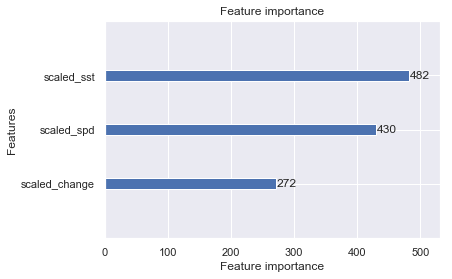

In [34]:
lgb.plot_importance(new);

In [35]:
import shap
shap.initjs()

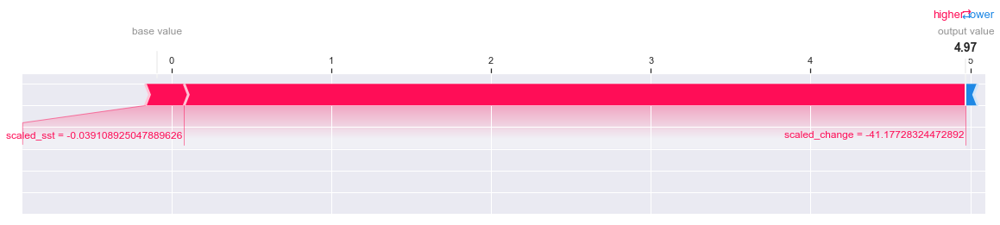

In [36]:
explainer = shap.TreeExplainer(new)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:], matplotlib=True)

To understand how a single feature effects the output of the model we can plot the SHAP value of that feature vs. the value of the feature for all the examples in a dataset. Since SHAP values represent a feature's responsibility for a change in the model output, the plot below represents the change in class (not on a scale from 0-1). Vertical dispersion at a single value of salinity change(labeled) represents interaction effects with other features. To help reveal these interactions, *dependence_plot* automatically selects another feature for coloring. In this case coloring based on class outcome highlights that the greater negative values of salinity change have less impact on the outcome with lower wind speed.

In [37]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

To understand how a single feature effects the output of the model we can plot the SHAP value of that feature vs. the value of the feature for all the examples in a dataset. Since SHAP values represent a feature's responsibility for a change in the model output, the plot below represents the change in class (not on a scale from 0-1). Vertical dispersion at a single value of salinity change(labeled) represents interaction effects with other features. To help reveal these interactions, *dependence_plot* automatically selects another feature for coloring. In this case coloring based on class outcome highlights that the greater negative values of salinity change have less impact on the outcome with lower wind speed.

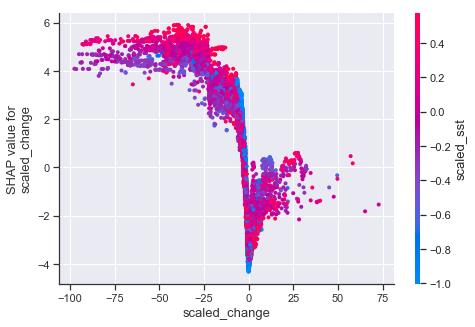

In [38]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("scaled_change", shap_values, X_train)

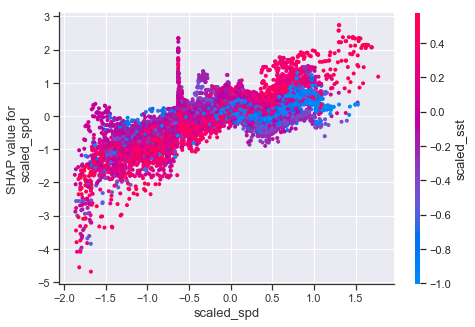

In [39]:
shap.dependence_plot("scaled_spd", shap_values, X_train)

To get an overview of which features are most important for a model we can plot the SHAP values of every feature for every sample. The plot below sorts features by the sum of SHAP value magnitudes over all samples, and uses SHAP values to show the distribution of the impacts each feature has on the model output. The color represents the feature value (red high, blue low). This reveals for example that a large, negative salinity change has a heavy impact on the model.

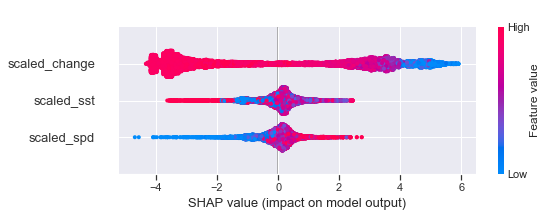

In [40]:
shap.summary_plot(shap_values, X_train)

We can also just take the mean absolute value of the SHAP values for each feature to get a standard bar plot:

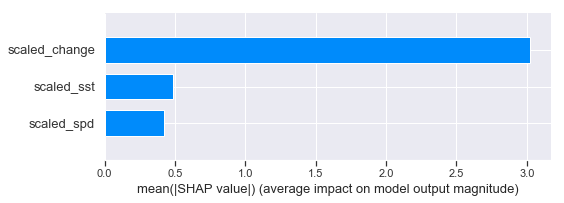

In [41]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

# Initial Thoughts

# Testing Models on others

Seems like as Spurs2 is tougher to predict, we should fit it to this first..

## The Forest Model

In [84]:
new_pred = forest_class1.predict(X_test)
print('Spurs2 Model on Spurs2 Set\n',confusion_matrix(y_test1, preds1), '\n', forest_class1.score(X_test1, y_test1), '\n')
print('Spurs2 Model on Spurs1 Set\n',confusion_matrix(y_test, new_pred), '\n', forest_class1.score(X_test, y_test))

Spurs2 Model on Spurs2 Set
 [[1993   87]
 [ 119 1928]] 
 0.9515386479282772 

Spurs2 Model on Spurs1 Set
 [[2131  147]
 [ 248 2027]] 
 0.9132440149352076


## XGBoost

In [189]:
xgb_new = xgb1.predict(X_test)
print('Spurs2 Model on Spurs2 Set\n',confusion_matrix(y_test1, xgb_preds1), '\n', xgb1.score(X_test1, y_test1), '\n')
print('Spurs2 Model on Spurs1 Set\n',confusion_matrix(y_test, xgb_new), '\n', xgb1.score(X_test, y_test))

Spurs2 Model on Spurs2 Set
 [[1972  108]
 [ 149 1898]] 
 0.9377271625878362 

Spurs2 Model on Spurs1 Set
 [[2121  157]
 [ 149 2126]] 
 0.9327915660004392


In [190]:
print(X_test.shape)
print(X_test1.shape)

(4553, 3)
(4127, 3)


In [196]:
print(oversampled_train.shape[0]*0.25)
print(oversampled_train1.shape[0]*0.25)

4552.5
5158.5


## Light Gradient Boosting

In [94]:
lgb_new = new.predict(X_test1)
print('Spurs1 Model on Spurs2 Set\n',confusion_matrix(y_test, preds), '\n', new.score(X_test, y_test), '\n')
print('Spurs1 Model on Spurs2 Set\n',confusion_matrix(y_test1, lgb_new), '\n', new.score(X_test1, y_test1))

Spurs1 Model on Spurs2 Set
 [[2253   25]
 [   7 2268]] 
 0.9929716670327257 

Spurs1 Model on Spurs2 Set
 [[2053   27]
 [ 975 1072]] 
 0.7572086261206687


In [95]:
lgb_new1 = new1.predict(X_test)
print('Spurs2 Model on Spurs2 Set\n',confusion_matrix(y_test1, preds1), '\n', lgb1.score(X_test1, y_test1), '\n')
print('Spurs2 Model on Spurs1 Set\n',confusion_matrix(y_test, lgb_new1), '\n', lgb1.score(X_test, y_test))

Spurs2 Model on Spurs2 Set
 [[1974  106]
 [ 150 1897]] 
 0.9379694693481948 

Spurs2 Model on Spurs1 Set
 [[2113  165]
 [ 154 2121]] 
 0.9330112014056666


## Voting Classifier/Vecstack